In [327]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 
from warnings import filterwarnings
filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [3]:
shipment_data = pd.read_csv("Sales_Shipment_Data.csv")
invent_data = pd.read_csv("Inventory_Stock_Data.csv")

### Data Audit

In [4]:
#1. Number of rows & Number of columns
#For Shipment data
rows = shipment_data.shape[0]
cols = shipment_data.shape[1]
print(f"Sales-Shipmentdata has {rows} rows and {cols} columns")
#For Inventory data
rows1 = invent_data.shape[0]
cols1 = invent_data.shape[1]
print(f"Inventory- Stocksdata has {rows1} rows and {cols1} columns")

Sales-Shipmentdata has 180519 rows and 46 columns
Inventory- Stocksdata has 118 rows and 11 columns


In [5]:
#2.Number of numerical & categorical columns
#For Shipment data
numerical_cols = shipment_data.select_dtypes(include=['float64','int64']).columns
categorical_cols = shipment_data.select_dtypes(include='object').columns
print(f"Sales-Shipmentdata has {len(numerical_cols)} numerical columns and {len(categorical_cols)} categorical columns")
#For Inventory data
numerical_cols1 = invent_data.select_dtypes(include=['float64','int64']).columns
categorical_cols1 = invent_data.select_dtypes(include='object').columns
print(f"Inventory- Stocksdata has {len(numerical_cols1)} numerical columns and {len(categorical_cols1)} categorical columns")

Sales-Shipmentdata has 24 numerical columns and 22 categorical columns
Inventory- Stocksdata has 9 numerical columns and 2 categorical columns


In [6]:
shipment_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 46 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Product Category Id            180519 non-null  int64  
 1   Category Name                  180519 non-null  object 
 2   Class                          180519 non-null  object 
 3   Customer City                  180519 non-null  object 
 4   Customer Country               180519 non-null  object 
 5   Customer Fname                 180519 non-null  object 
 6   Customer Id                    180519 non-null  int64  
 7   Customer Lname                 180511 non-null  object 
 8   Customer Segment               180519 non-null  object 
 9   Customer State                 180519 non-null  object 
 10  Customer Street                180519 non-null  object 
 11  Customer Zipcode               180516 non-null  float64
 12  Delivery Status               

In [7]:
invent_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118 entries, 0 to 117
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   order-now      118 non-null    object
 1   product id     118 non-null    int64 
 2   product name   118 non-null    object
 3   avg lead time  118 non-null    int64 
 4   avg order qty  118 non-null    int64 
 5   current stock  118 non-null    int64 
 6   max lead time  118 non-null    int64 
 7   max order qty  118 non-null    int64 
 8   mod            118 non-null    int64 
 9   reorder point  118 non-null    int64 
 10  safety stock   118 non-null    int64 
dtypes: int64(9), object(2)
memory usage: 10.3+ KB


In [8]:
#Any other observations from the data in terms of cleaning, preparation required?
#For Shipment data
#CHecking for missing values
shipment_data.isnull().sum()

Product Category Id              0
Category Name                    0
Class                            0
Customer City                    0
Customer Country                 0
Customer Fname                   0
Customer Id                      0
Customer Lname                   8
Customer Segment                 0
Customer State                   0
Customer Street                  0
Customer Zipcode                 3
Delivery Status                  0
Department Id                    0
Department Name                  0
Market                           0
Order City                       0
Order Country                    0
order date (DateOrders)          0
Order Id                         0
Order Region                     0
Order State                      0
Order Status                     0
Product Id                       0
Product Name                     0
shipping date (DateOrders)       0
Shipping Mode                    0
Type                             0
Benefit per order   

In [9]:
#filling missing values
mode= shipment_data['Customer Zipcode'].mode()
shipment_data['Customer Zipcode'] = shipment_data['Customer Zipcode'].fillna(mode[0]) # as there may be multiple modes
shipment_data['Customer Lname'].fillna('Unk',inplace=True)
shipment_data.isnull().sum()

Product Category Id              0
Category Name                    0
Class                            0
Customer City                    0
Customer Country                 0
Customer Fname                   0
Customer Id                      0
Customer Lname                   0
Customer Segment                 0
Customer State                   0
Customer Street                  0
Customer Zipcode                 0
Delivery Status                  0
Department Id                    0
Department Name                  0
Market                           0
Order City                       0
Order Country                    0
order date (DateOrders)          0
Order Id                         0
Order Region                     0
Order State                      0
Order Status                     0
Product Id                       0
Product Name                     0
shipping date (DateOrders)       0
Shipping Mode                    0
Type                             0
Benefit per order   

In [10]:
#Checking Duplicate Records
dups = shipment_data.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 0


In [11]:
##For Inventory data
#Checking for missing values
invent_data.isnull().sum()

order-now        0
product id       0
product name     0
avg lead time    0
avg order qty    0
current stock    0
max lead time    0
max order qty    0
mod              0
reorder point    0
safety stock     0
dtype: int64

In [12]:
#Checking Duplicate Records
dups1 = invent_data.duplicated()
print('Number of duplicate rows = %d' % (dups1.sum()))

Number of duplicate rows = 0


### EDA 

In [13]:
#Detailed EDA - Univariate & Bi Variate analysis for each variable (distributions)
#For Shipment data
shipment_data.describe(include='all')

,Product Category Id,Category Name,Class,Customer City,Customer Country,Customer Fname,Customer Id,Customer Lname,Customer Segment,Customer State,...,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Order Item Total,Order Profit Per Order,Product Price,Sales,Sales per customer
count,180519.000000,180519,180519,180519,180519,180519,180519.000000,180519,180519,180519,...,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000
unique,NaN,50,3,563,2,782,NaN,1110,3,46,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Cleats,High Value-Small Number,Caguas,EE. UU.,Mary,NaN,Smith,Consumer,PR,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,24551,67738,66770,111146,65150,NaN,64104,93504,69373,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,31.851451,NaN,NaN,NaN,NaN,NaN,6691.379495,NaN,NaN,NaN,...,0.101668,90260.000000,141.232550,0.120647,2.127638,183.107609,21.974989,141.232550,203.772096,183.107609
std,15.640064,NaN,NaN,NaN,NaN,NaN,4162.918106,NaN,NaN,NaN,...,0.070415,52111.490959,139.732492,0.466796,1.453451,120.043670,104.433526,139.732492,132.273077,120.043670
min,2.000000,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,...,0.000000,1.000000,9.990000,-2.750000,1.000000,7.490000,-4274.979980,9.990000,9.990000,7.490000
25%,18.000000,NaN,NaN,NaN,NaN,NaN,3258.500000,NaN,NaN,NaN,...,0.040000,45130.500000,50.000000,0.080000,1.000000,104.379997,7.000000,50.000000,119.980003,104.379997
50%,29.000000,NaN,NaN,NaN,NaN,NaN,6457.000000,NaN,NaN,NaN,...,0.100000,90260.000000,59.990002,0.270000,1.000000,163.990005,31.520000,59.990002,199.919998,163.990005
75%,45.000000,NaN,NaN,NaN,NaN,NaN,9779.000000,NaN,NaN,NaN,...,0.160000,135389.500000,199.990005,0.360000,3.000000,247.399994,64.800003,199.990005,299.950012,247.399994


In [335]:
shipment_data.describe(include='all').T

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
prod_cat_id,180519.0,NaN,NaN,NaN,31.851451,2.0,18.0,29.0,45.0,76.0,15.640064
cat_name,180519,50,Cleats,24551,NaN,NaN,NaN,NaN,NaN,NaN,NaN
class,180519,3,High Value-Small Number,67738,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cust_city,180519,563,Caguas,66770,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cust_country,180519,2,EE. UU.,111146,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cust_id,180519.0,NaN,NaN,NaN,6691.379495,1.0,3258.5,6457.0,9779.0,20757.0,4162.918106
cust_segment,180519,3,Consumer,93504,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cust_state,180519,46,PR,69373,NaN,NaN,NaN,NaN,NaN,NaN,NaN
delivery_status,180519,4,Late,98977,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dept_id,180519.0,NaN,NaN,NaN,5.44346,2.0,4.0,5.0,7.0,12.0,1.629246


In [336]:
shipment_data.head()

,prod_cat_id,cat_name,class,cust_city,cust_country,cust_id,cust_segment,cust_state,delivery_status,dept_id,...,order_profit_per_order,prod_price,sales,sales_per_cust,late_delivery_risk,monthly_order,yearly_order,quarterly_order,weekly_order,total_profit
0,24,Women's Apparel,Moderate Value-Moderate Number,Roswell,EE. UU.,5673,Corporate,NM,Late,5,...,9.610000,50.0,100.0,85.0,Late,2017-02,2017,2017Q1,2017-02-20/2017-02-26,19.219999
1,24,Women's Apparel,Moderate Value-Moderate Number,Los Angeles,EE. UU.,9723,Corporate,CA,Late,5,...,9.490000,50.0,100.0,84.0,Late,2015-02,2015,2015Q1,2015-02-23/2015-03-01,18.980000
2,24,Women's Apparel,Moderate Value-Moderate Number,Harvey,EE. UU.,9511,Corporate,IL,Late,5,...,30.709999,50.0,100.0,94.5,Late,2017-01,2017,2017Q1,2017-01-23/2017-01-29,61.419998
3,24,Women's Apparel,Moderate Value-Moderate Number,Elmhurst,EE. UU.,3326,Corporate,IL,Late,5,...,27.549999,50.0,100.0,95.0,Late,2015-01,2015,2015Q1,2015-01-12/2015-01-18,55.099998
4,24,Women's Apparel,Moderate Value-Moderate Number,North Las Vegas,EE. UU.,907,Corporate,NV,Late,5,...,47.500000,50.0,100.0,95.0,Late,2017-03,2017,2017Q1,2017-03-27/2017-04-02,95.000000


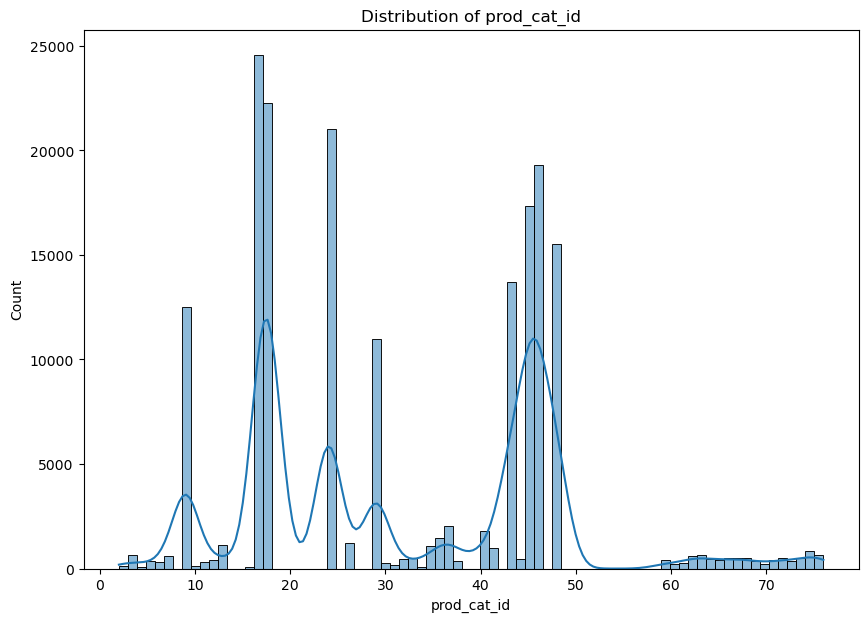

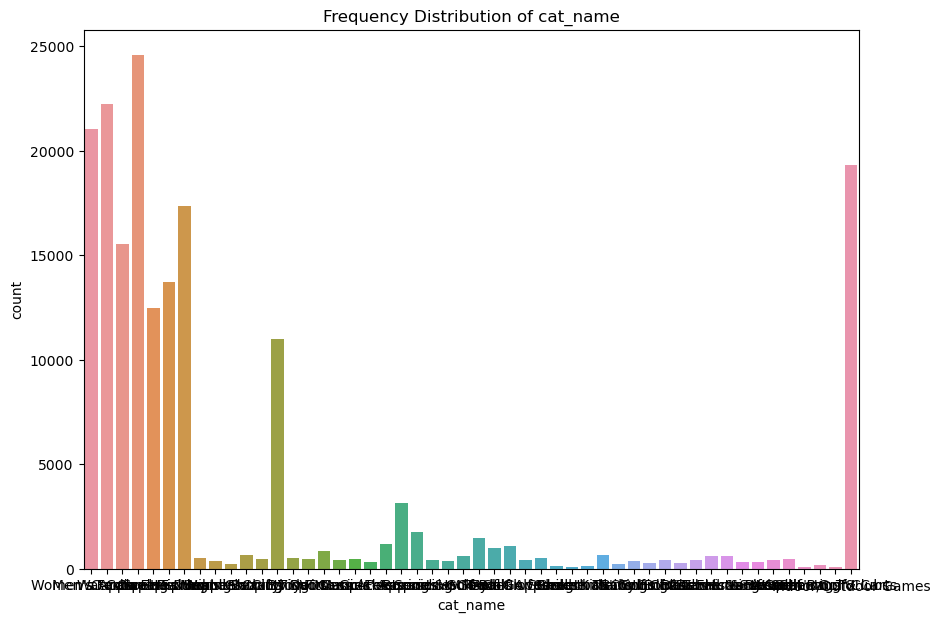

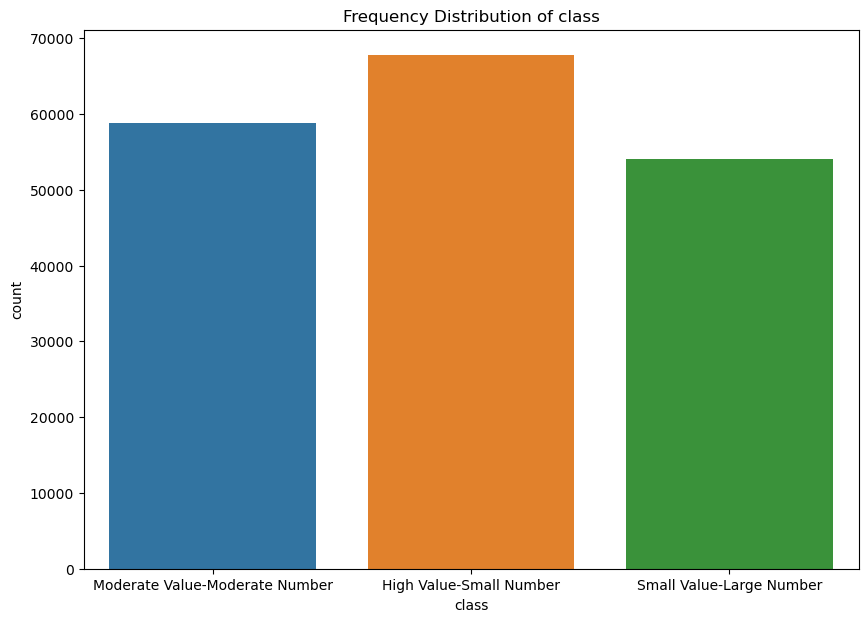

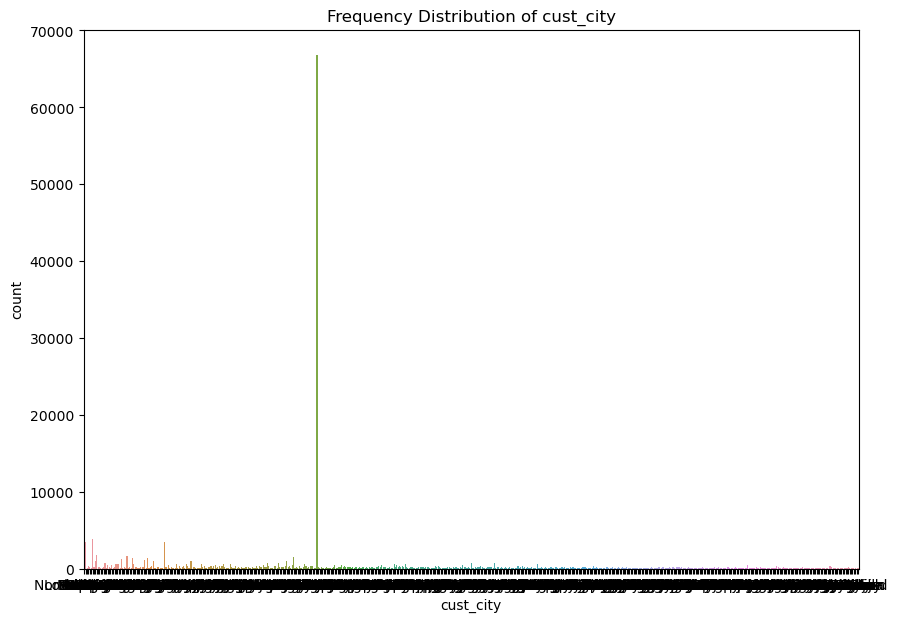

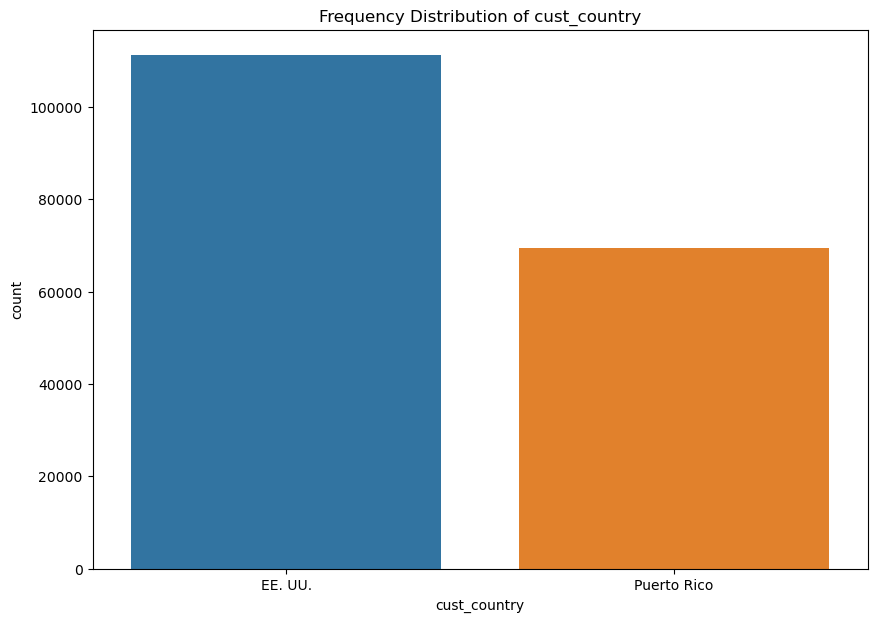

...

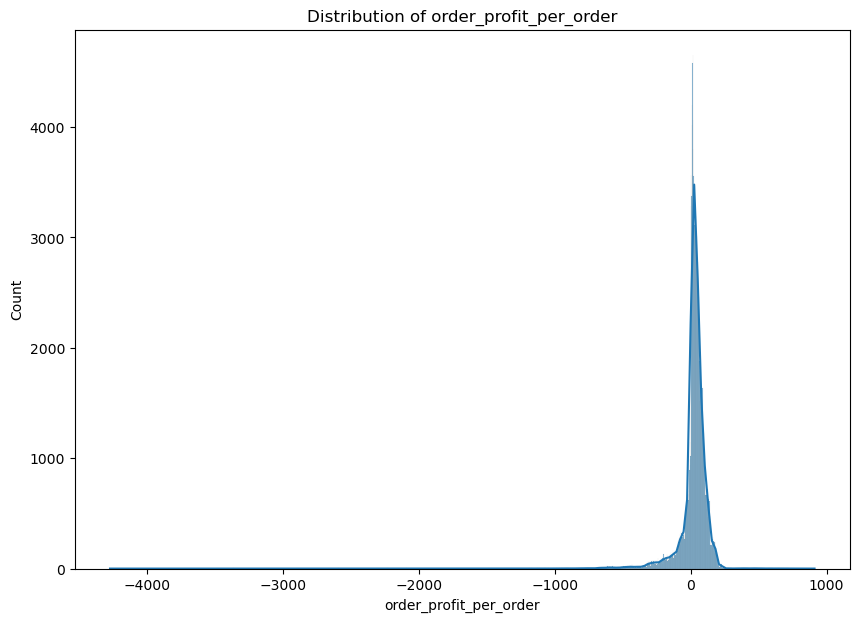

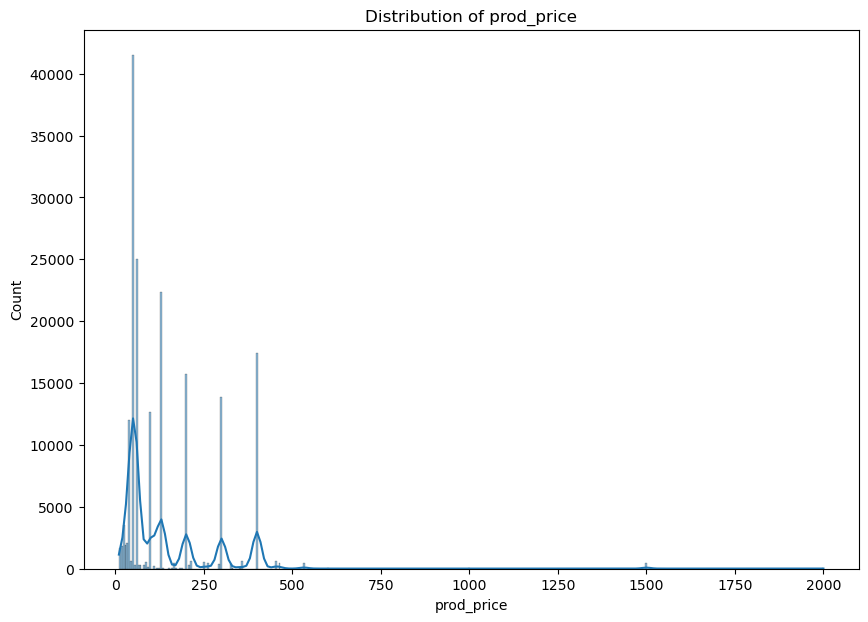

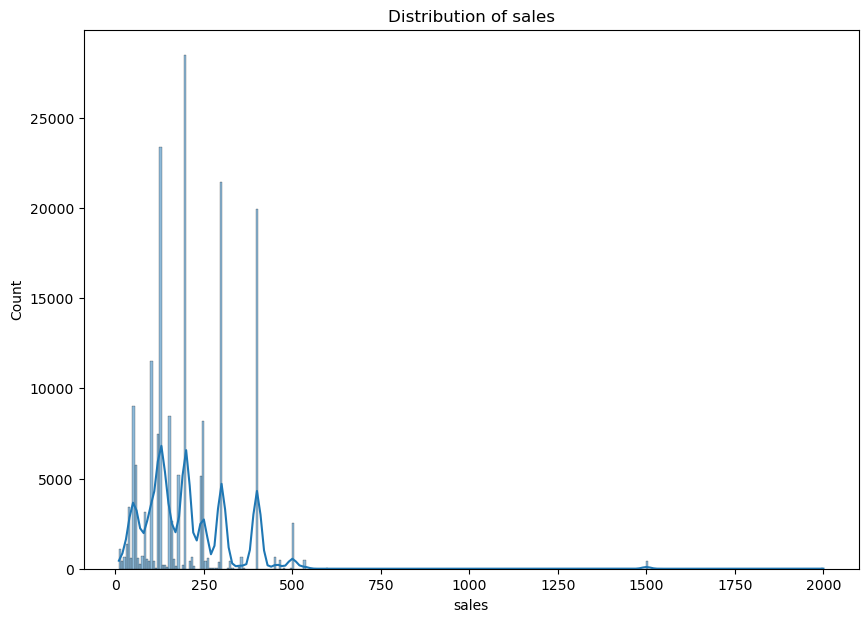

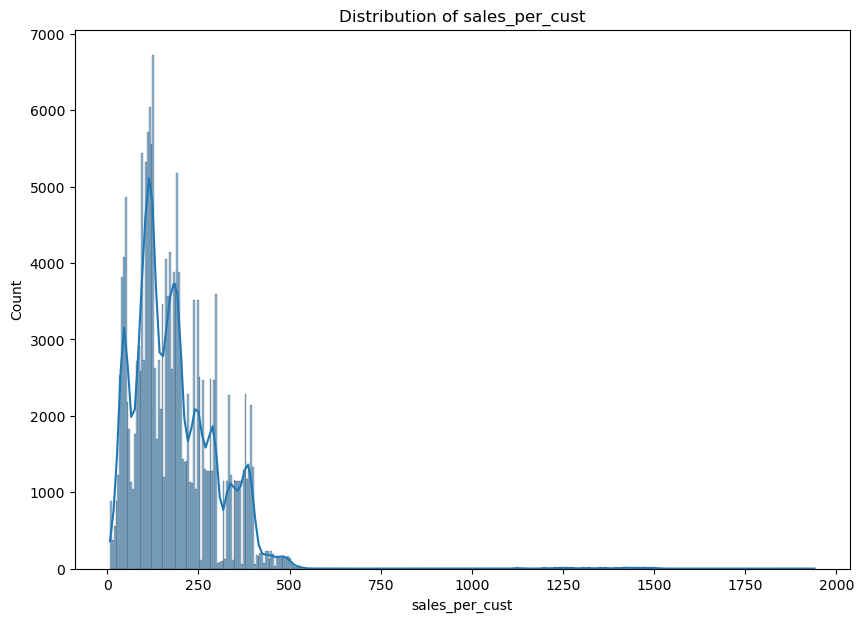

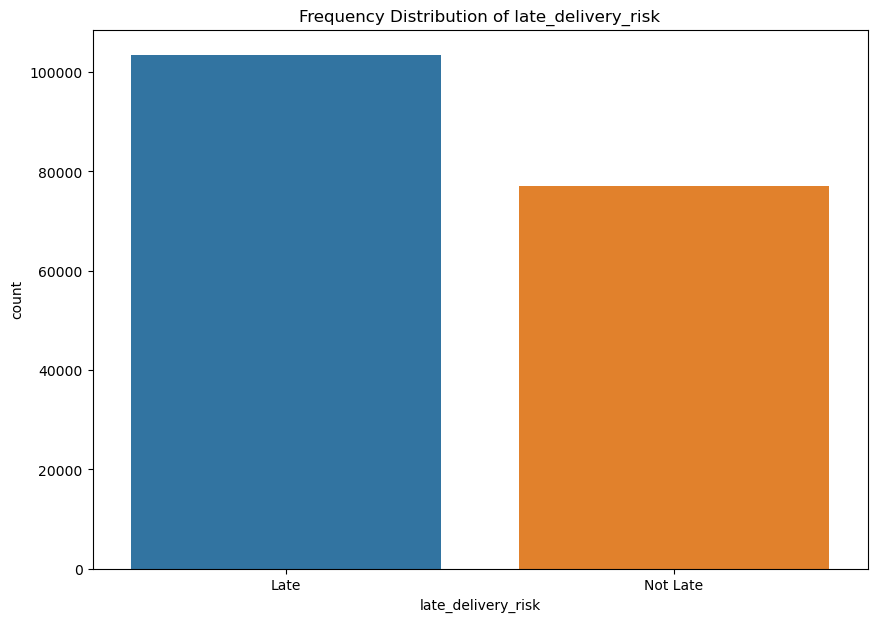

TypeError: Invalid object type at position 0

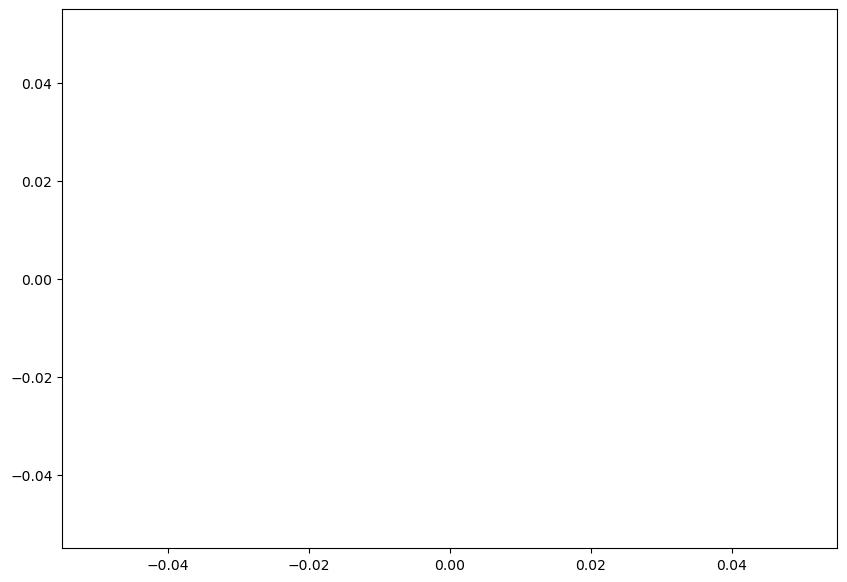

In [337]:
# Univariate Analysis 
for col in shipment_data.columns:
    if shipment_data[col].dtype == 'object': # for categorical columns
        plt.figure(figsize=(10, 7))
        sns.countplot(x=col, data=shipment_data)
        plt.title(f'Frequency Distribution of {col}')
        plt.show()
    else:                                   # for numerical columns
        plt.figure(figsize=(10, 7))
        sns.histplot(shipment_data[col],kde=True)
        plt.title(f'Distribution of {col}')
        plt.show()
        

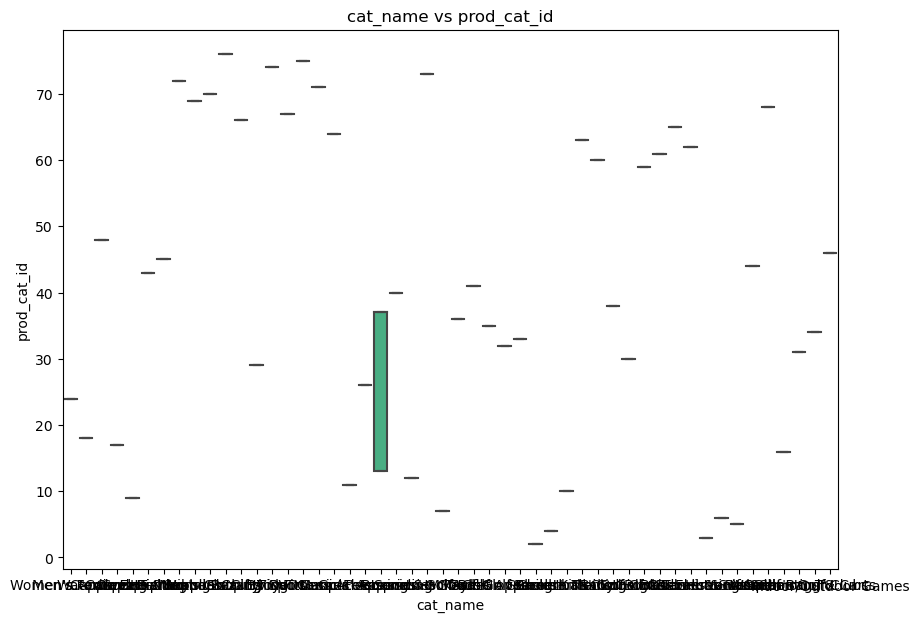

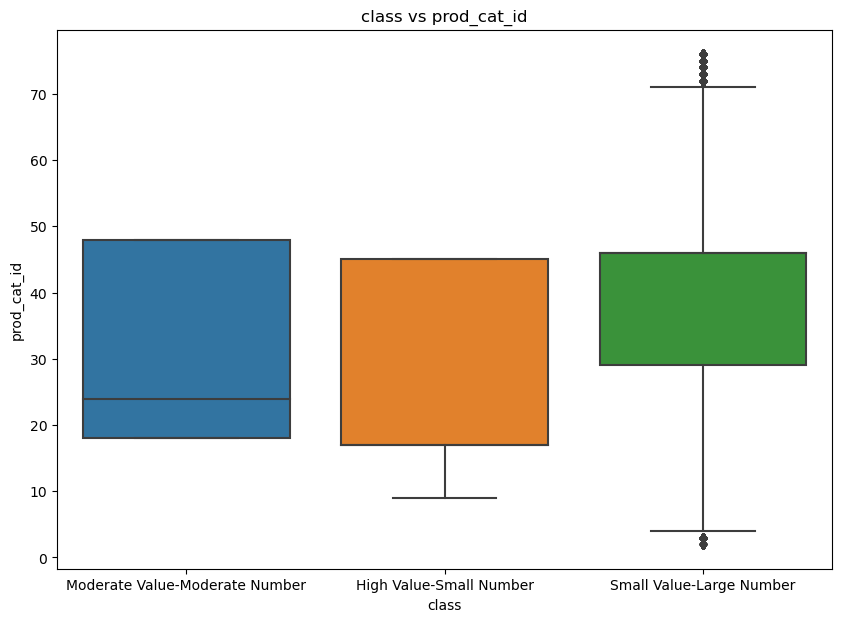

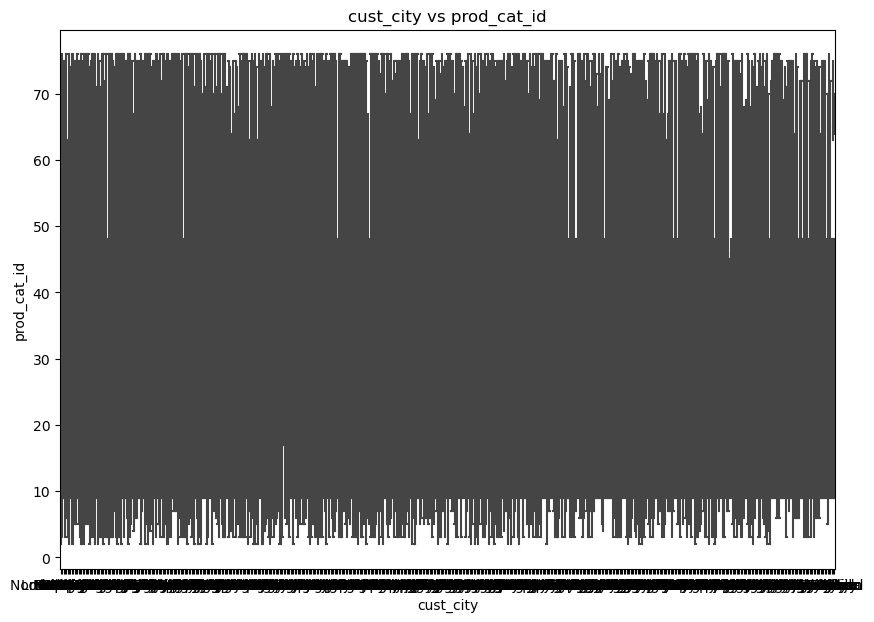

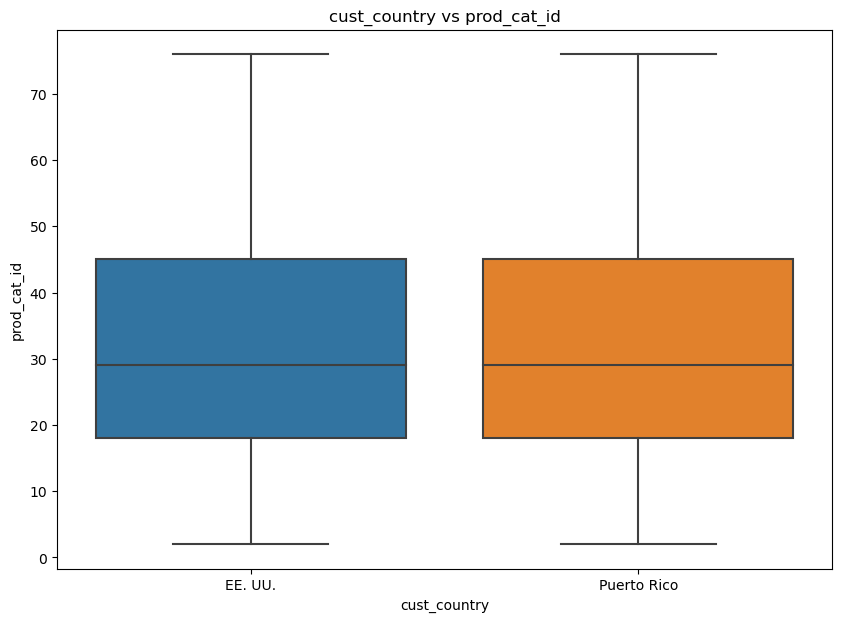

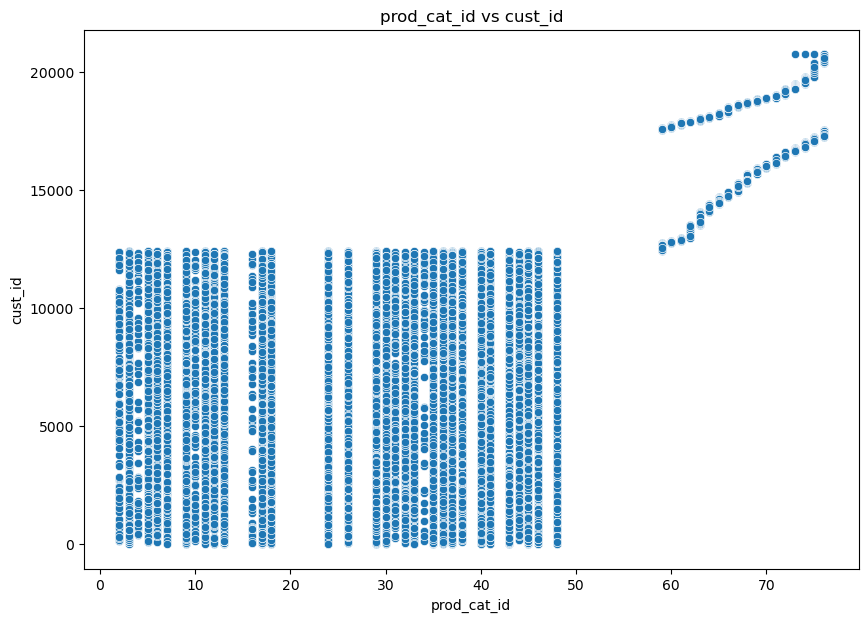

...

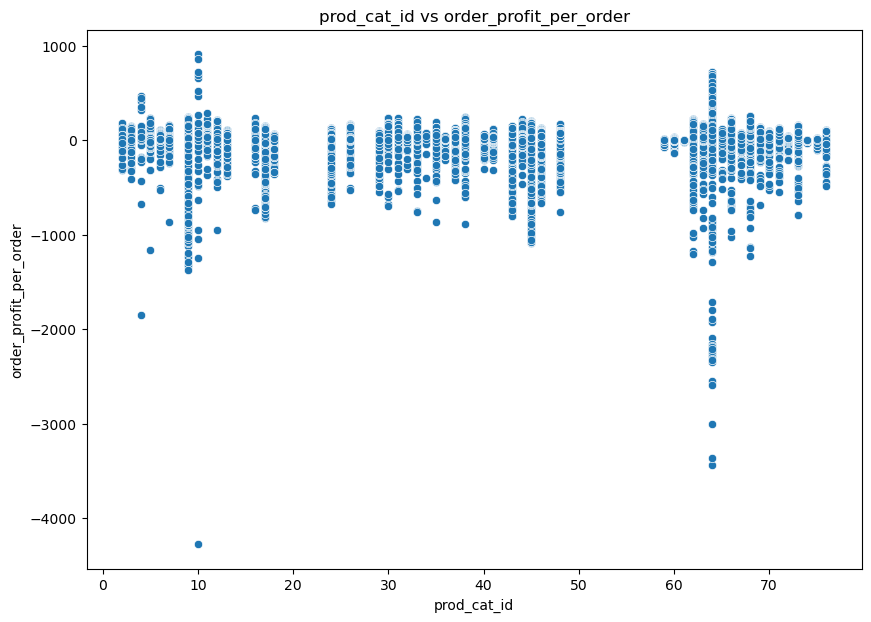

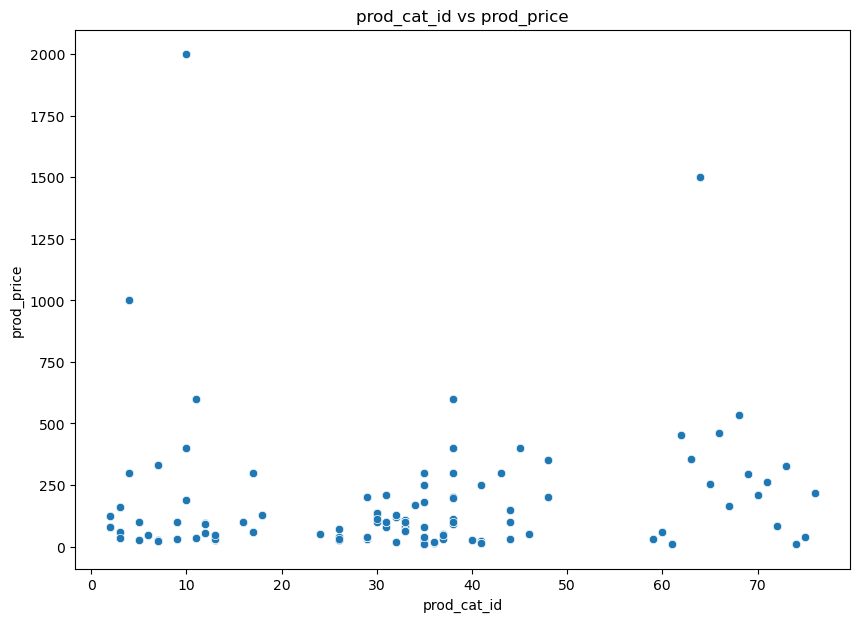

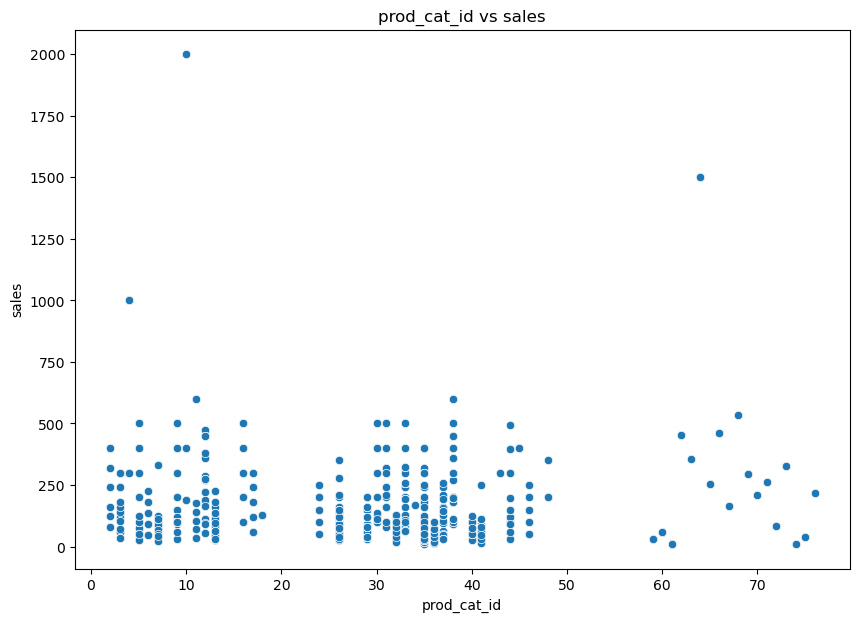

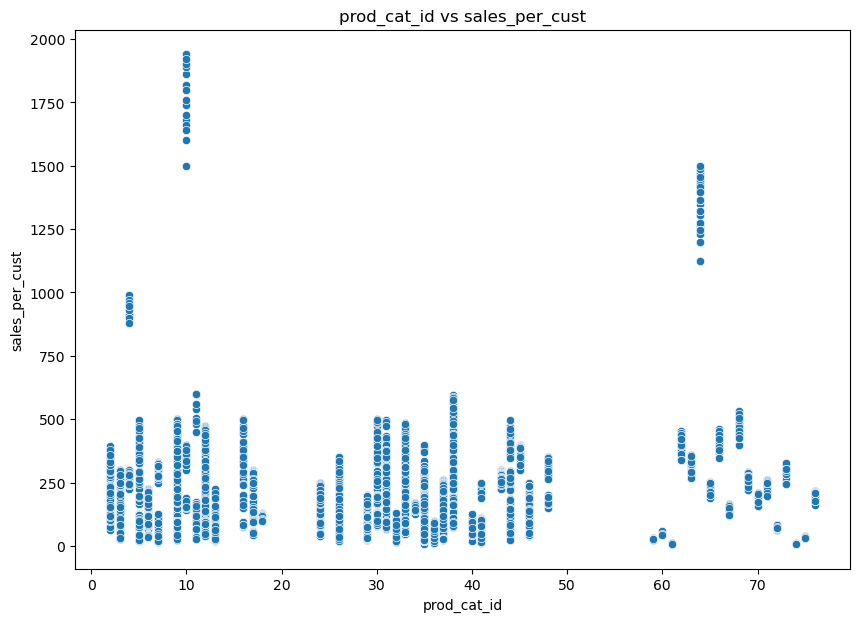

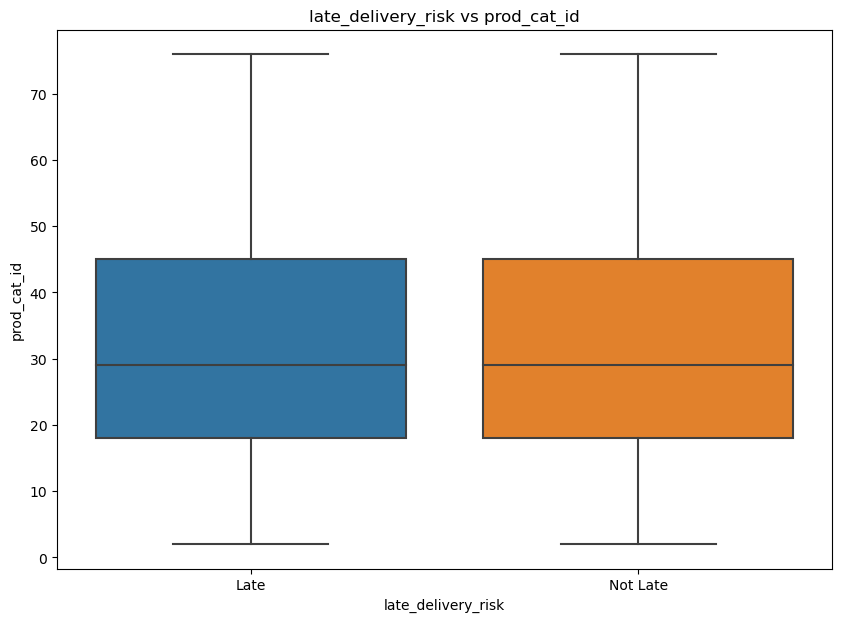

TypeError: float() argument must be a string or a real number, not 'Period'

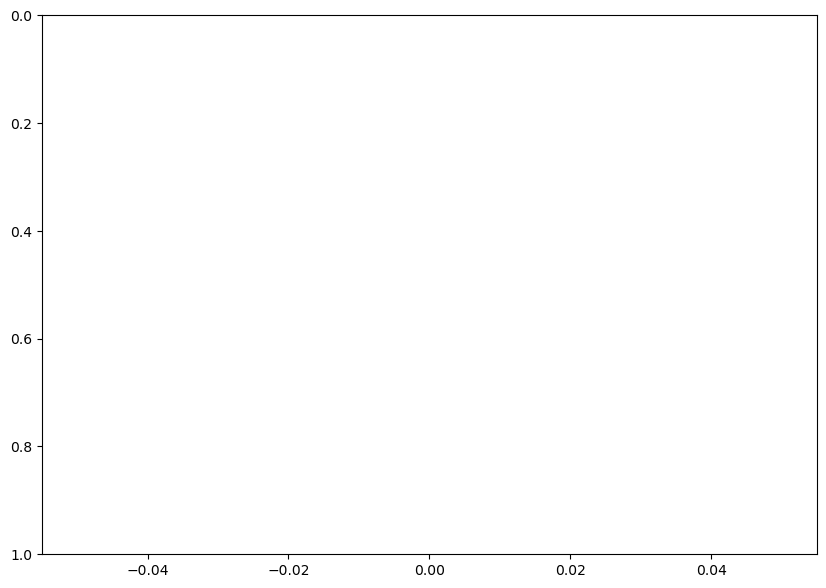

In [338]:
# Bivariate Analysis
for col1 in shipment_data.columns:
    for col2 in shipment_data.columns:
        if col1 != col2:
            if shipment_data[col1].dtype != 'object' and shipment_data[col2].dtype != 'object': # for numerical-numerical columns
                plt.figure(figsize=(10,7))
                sns.scatterplot(x=col1, y=col2, data = shipment_data)
                plt.title(f'{col1} vs {col2}')
                plt.show()
            elif shipment_data[col1].dtype != 'object' and shipment_data[col2].dtype == 'object':# for numerical-categorical columns
                plt.figure(figsize=(10,7))
                sns.boxplot(x=col2, y=col1, data = shipment_data)
                plt.title(f'{col2} vs {col1}')
                plt.show()
            elif shipment_data[col1].dtype == 'object' and shipment_data[col2].dtype != 'object':# for categorical-numerical columns
                plt.figure(figsize=(10,7))
                sns.boxplot(x=col2, y=col1, data = shipment_data)
                plt.title(f'{col2} vs {col1}')
                plt.show()
            else:                                                                              # for categorical-categorical columns
                crosstable = pd.crosstab(shipment_data[col1],shipment_data[col2])
                crosstable.plot(kind='bar',stacked =True)
                plt.figure(figsize=(10,7))
                plt.title(f'Stacked Bar Plot {col1} vs {col2}')
                plt.show()
                
                

In [16]:
# For Inventory Data
invent_data.describe(include='all')

,order-now,product id,product name,avg lead time,avg order qty,current stock,max lead time,max order qty,mod,reorder point,safety stock
count,118,118.000000,118,118.0,118.000000,118.000000,118.0,118.000000,118.000000,118.000000,118.000000
unique,2,NaN,118,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,green,NaN,Nike Men's Fingertrap Max Training Shoe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,64,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,689.576271,NaN,10.0,2.084746,160.720339,30.0,3.169492,0.542373,110.932203,90.330508
std,NaN,403.120380,NaN,0.0,1.000652,115.003819,0.0,2.001303,0.500326,70.045617,60.270055
min,NaN,19.000000,NaN,10.0,1.000000,35.000000,30.0,1.000000,0.000000,35.000000,25.000000
25%,NaN,303.500000,NaN,10.0,1.000000,63.000000,30.0,1.000000,0.000000,35.000000,25.000000
50%,NaN,729.000000,NaN,10.0,3.000000,175.000000,30.0,5.000000,1.000000,175.000000,144.000000
75%,NaN,905.750000,NaN,10.0,3.000000,321.000000,30.0,5.000000,1.000000,175.000000,146.000000


In [17]:
invent_data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
order-now,118,2,green,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product id,118.0,NaN,NaN,NaN,689.576271,403.12038,19.0,303.5,729.0,905.75,1363.0
product name,118,118,Nike Men's Fingertrap Max Training Shoe,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
avg lead time,118.0,NaN,NaN,NaN,10.0,0.0,10.0,10.0,10.0,10.0,10.0
avg order qty,118.0,NaN,NaN,NaN,2.084746,1.000652,1.0,1.0,3.0,3.0,3.0
current stock,118.0,NaN,NaN,NaN,160.720339,115.003819,35.0,63.0,175.0,321.0,330.0
max lead time,118.0,NaN,NaN,NaN,30.0,0.0,30.0,30.0,30.0,30.0,30.0
max order qty,118.0,NaN,NaN,NaN,3.169492,2.001303,1.0,1.0,5.0,5.0,5.0
mod,118.0,NaN,NaN,NaN,0.542373,0.500326,0.0,0.0,1.0,1.0,1.0
reorder point,118.0,NaN,NaN,NaN,110.932203,70.045617,35.0,35.0,175.0,175.0,175.0


In [18]:
invent_data.head()

,order-now,product id,product name,avg lead time,avg order qty,current stock,max lead time,max order qty,mod,reorder point,safety stock
0,green,19,Nike Men's Fingertrap Max Training Shoe,10,1,69,30,1,1,35,25
1,orange,24,Elevation Training Mask 2.0,10,3,175,30,5,0,175,144
2,green,35,adidas Brazuca 2014 Official Match Ball,10,1,65,30,1,1,35,25
3,green,37,adidas Kids' F5 Messi FG Soccer Cleat,10,3,328,30,5,1,175,146
4,orange,44,adidas Men's F10 Messi TRX FG Soccer Cleat,10,3,175,30,5,0,175,145


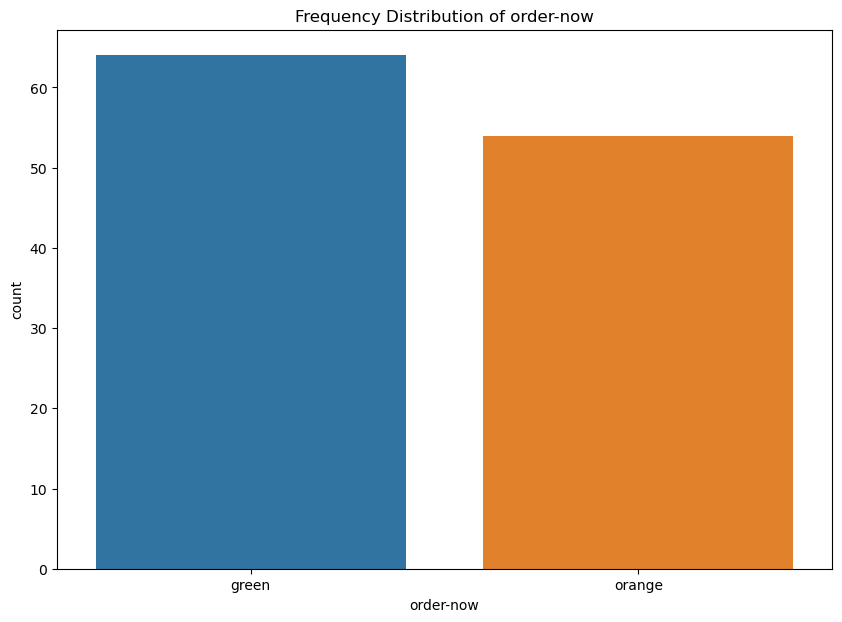

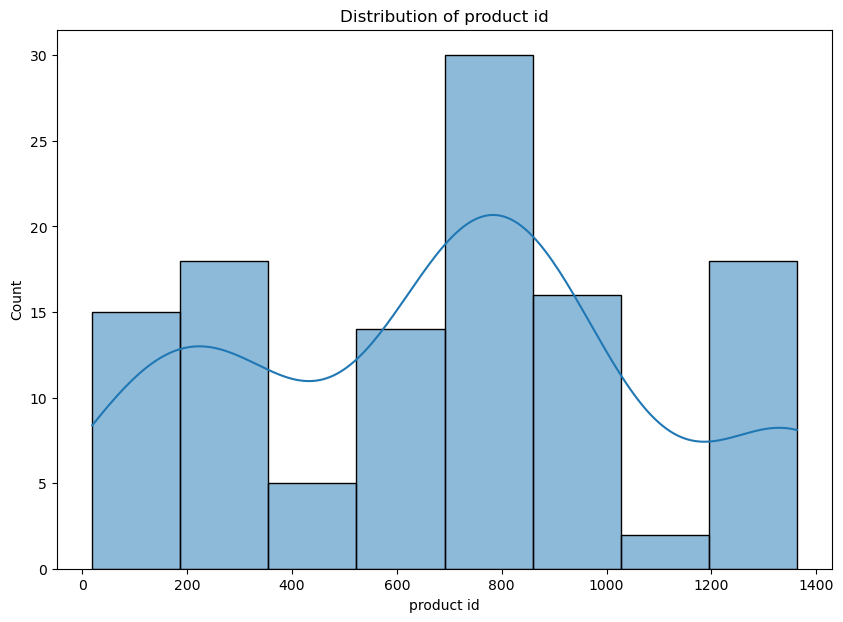

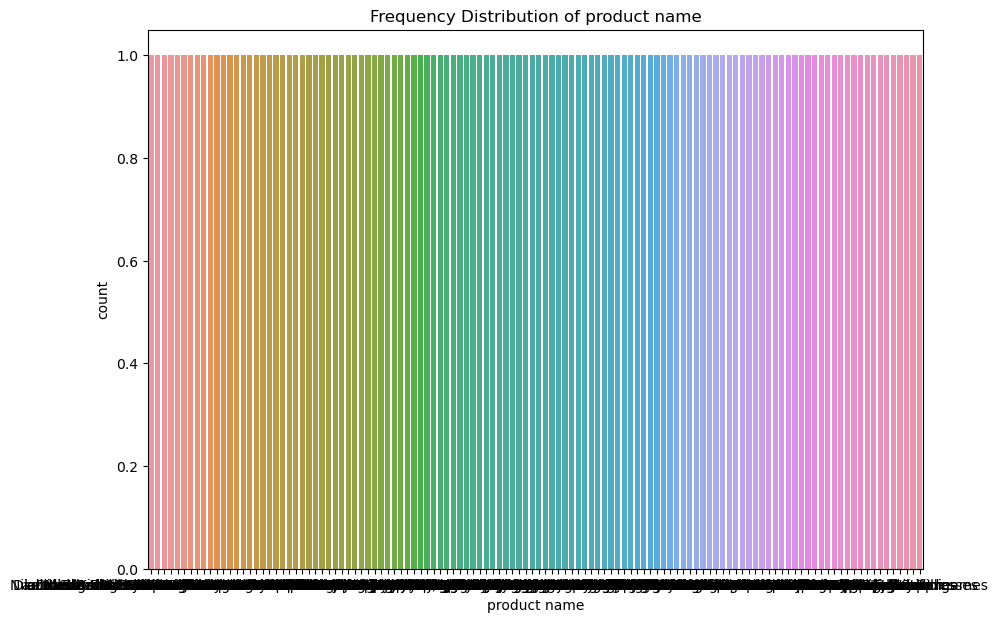

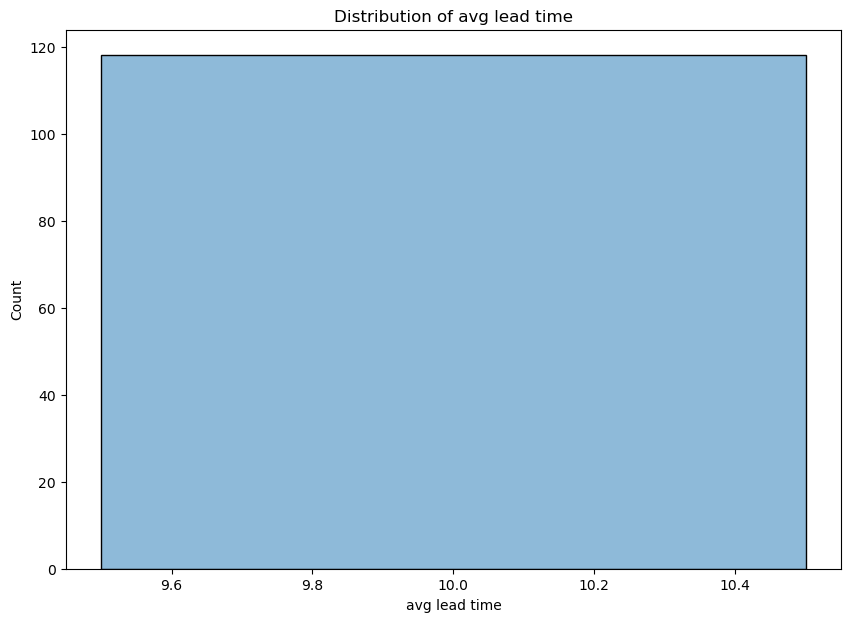

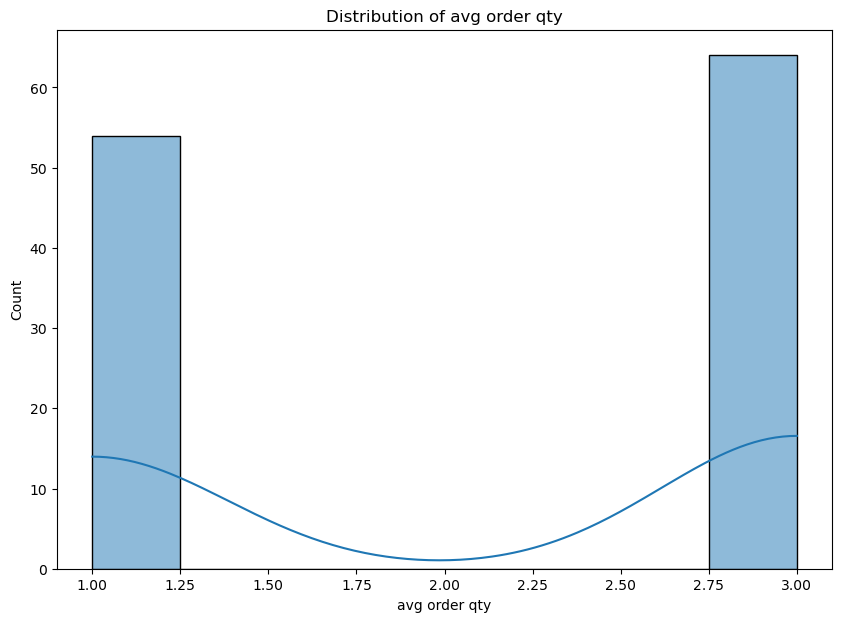

...

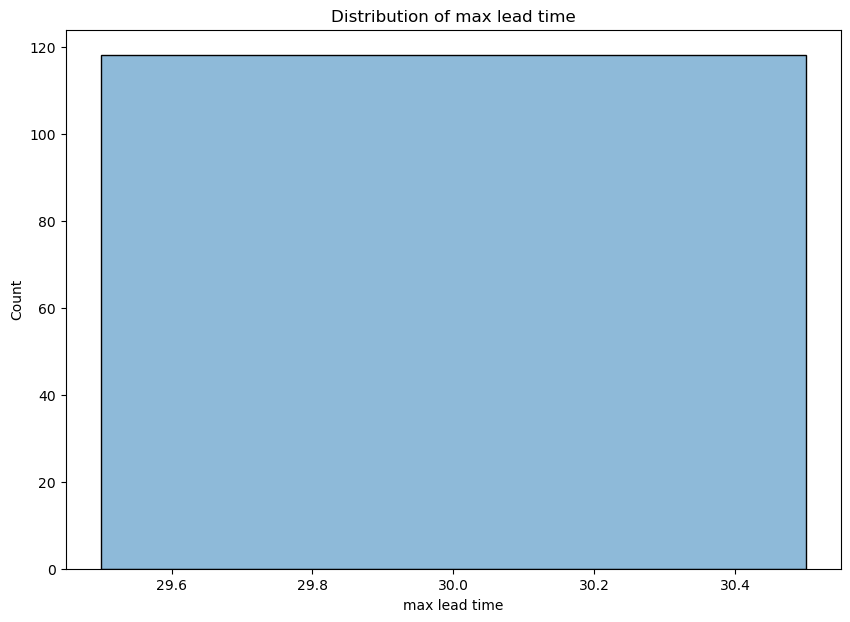

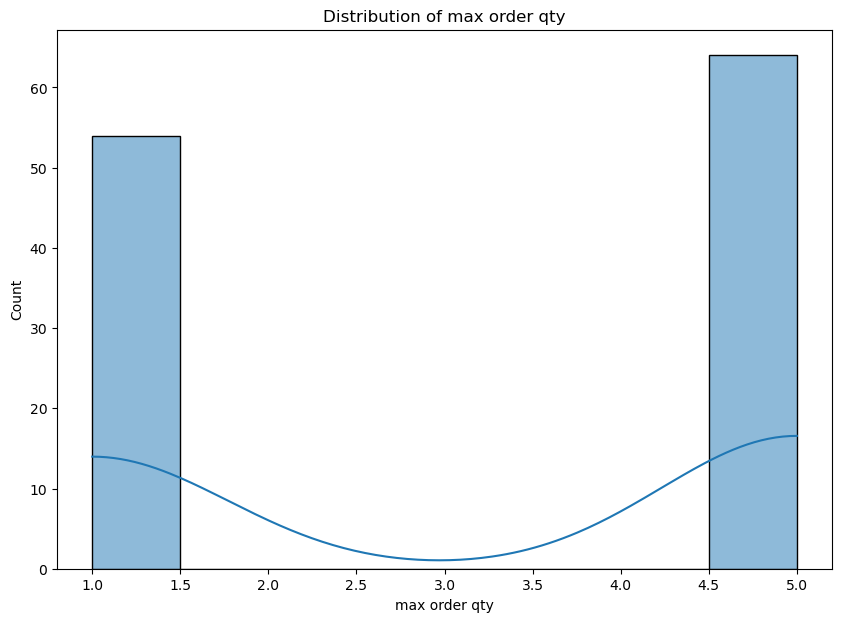

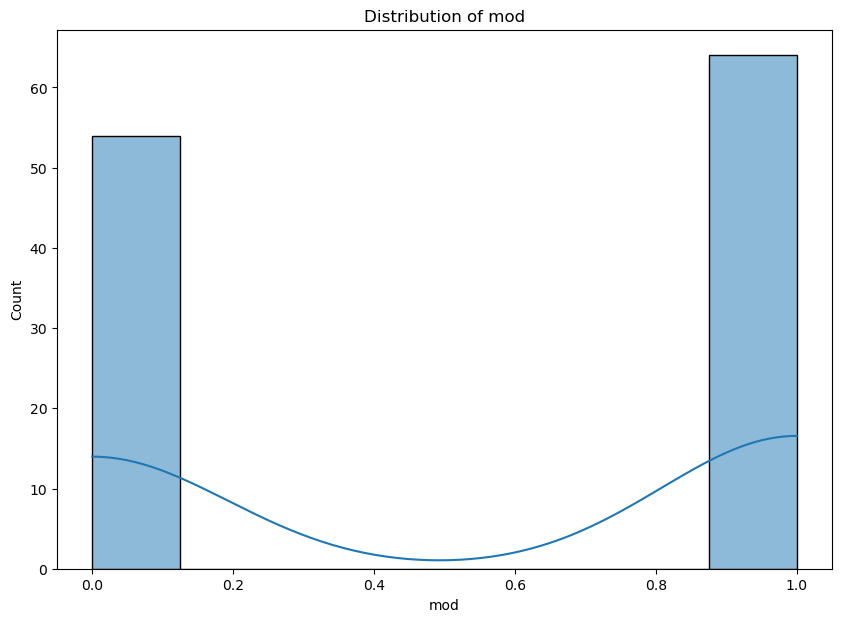

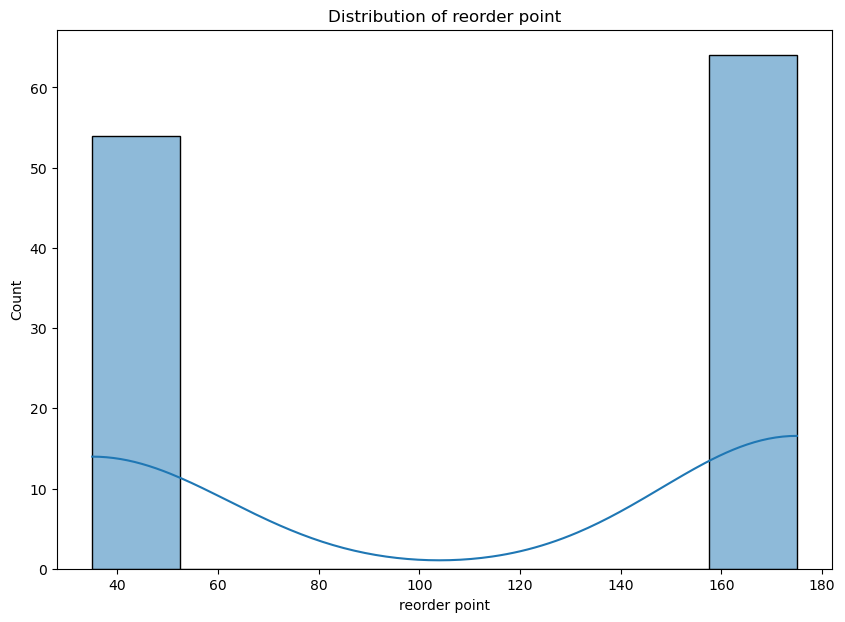

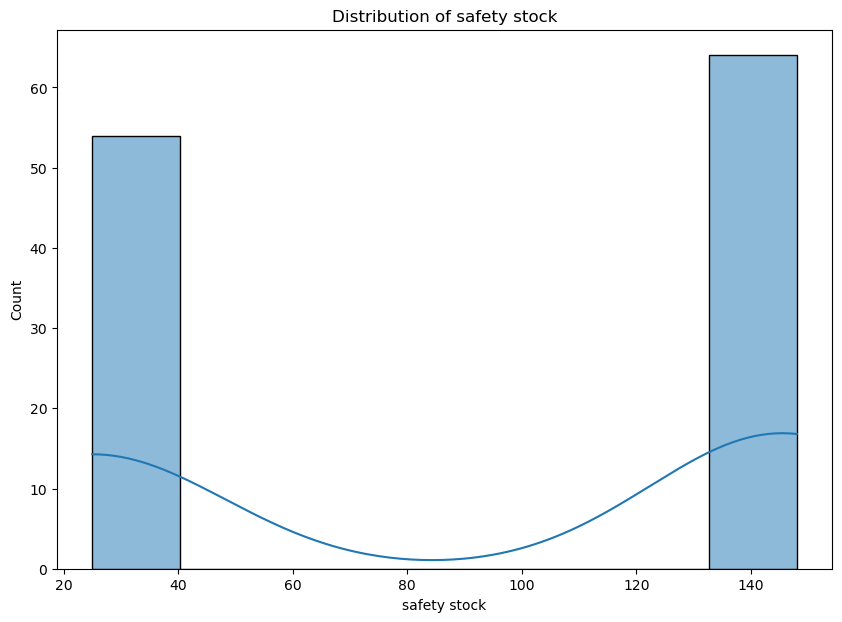

In [30]:
# Univariate Analysis 
for cols in invent_data.columns:
    if invent_data[cols].dtype == 'object': # for categorical columns
        plt.figure(figsize=(10, 7))
        sns.countplot(x=cols, data=invent_data)
        plt.title(f'Frequency Distribution of {cols}')
        plt.show()
    else:                                   # for numerical columns
        plt.figure(figsize=(10, 7))
        sns.histplot(invent_data[cols],kde=True)
        plt.title(f'Distribution of {cols}')
        plt.show()
        

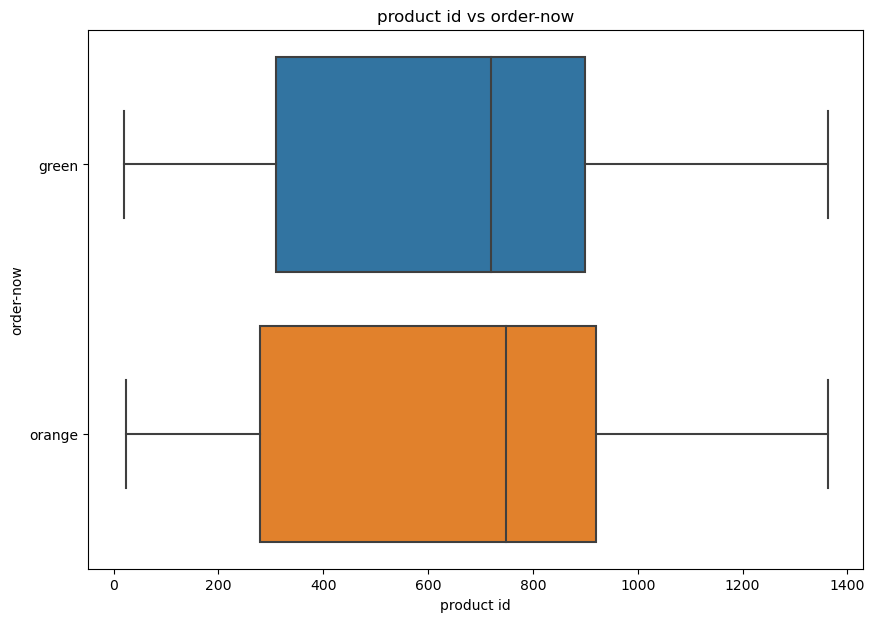

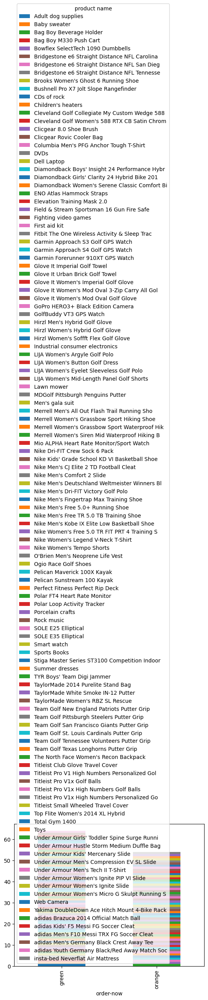

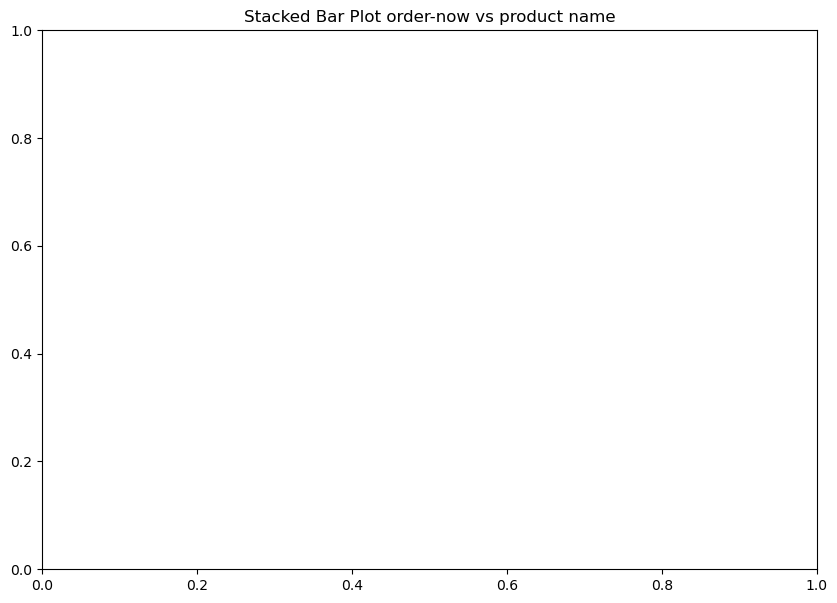

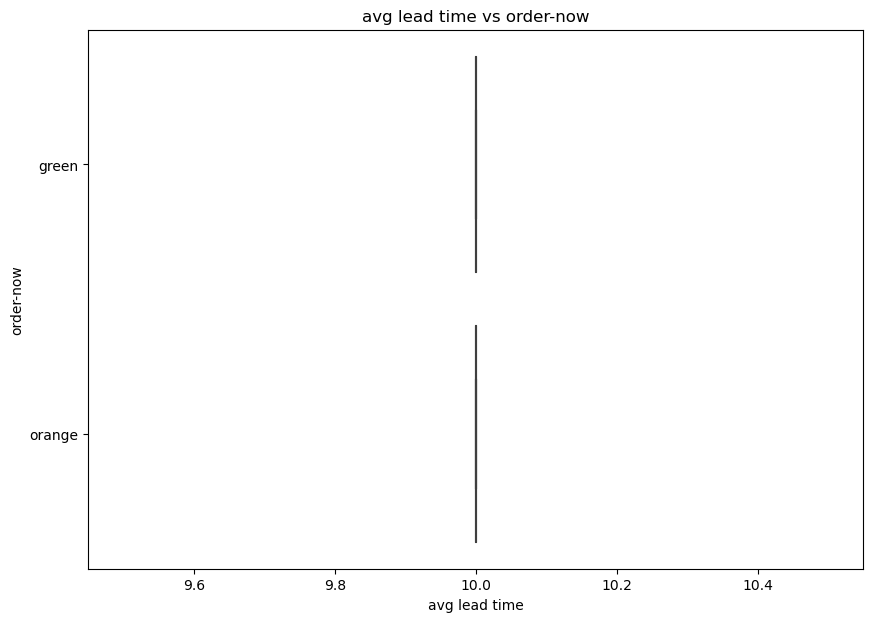

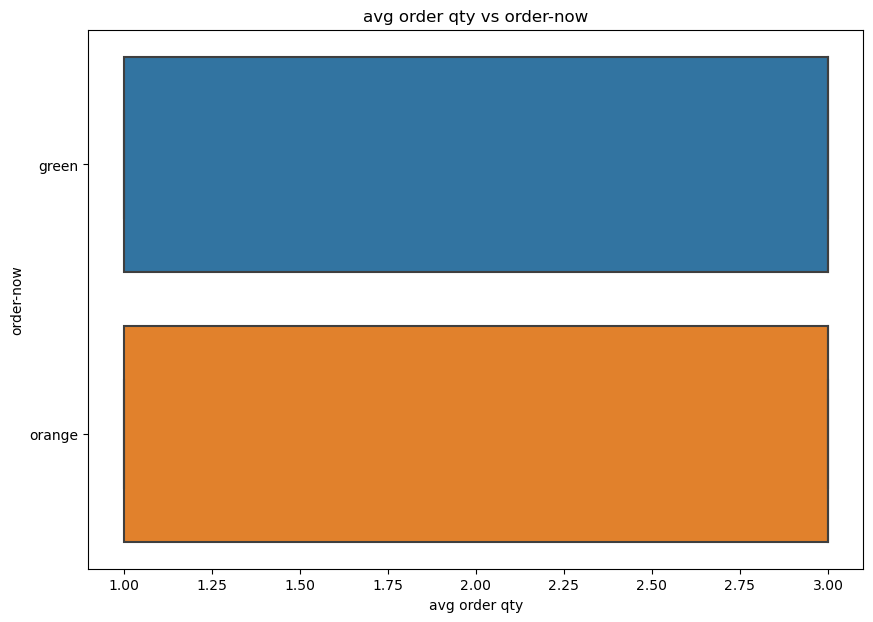

...

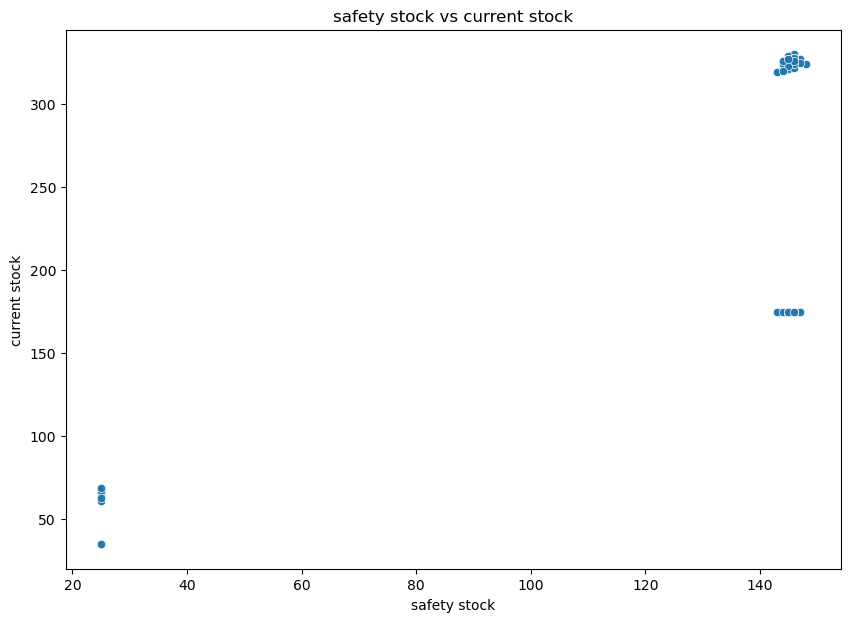

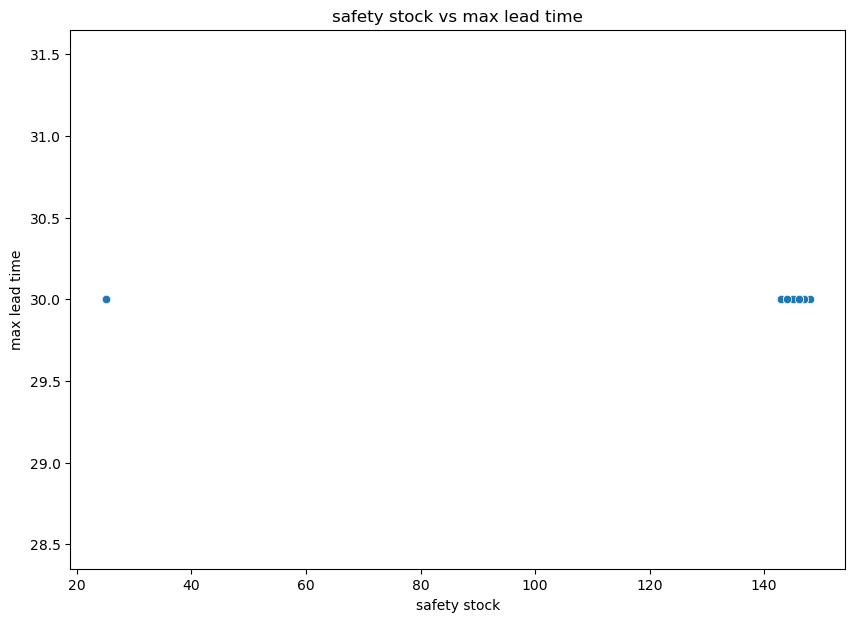

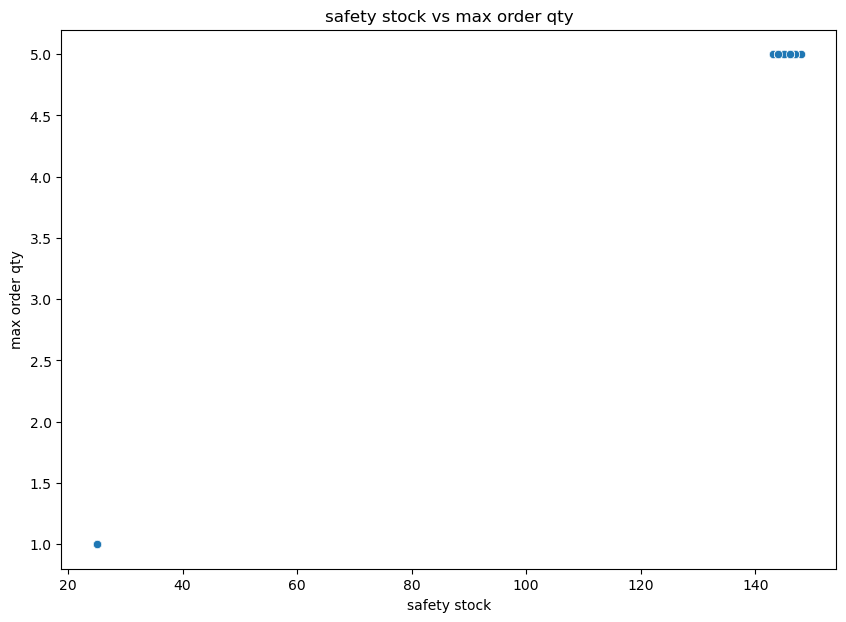

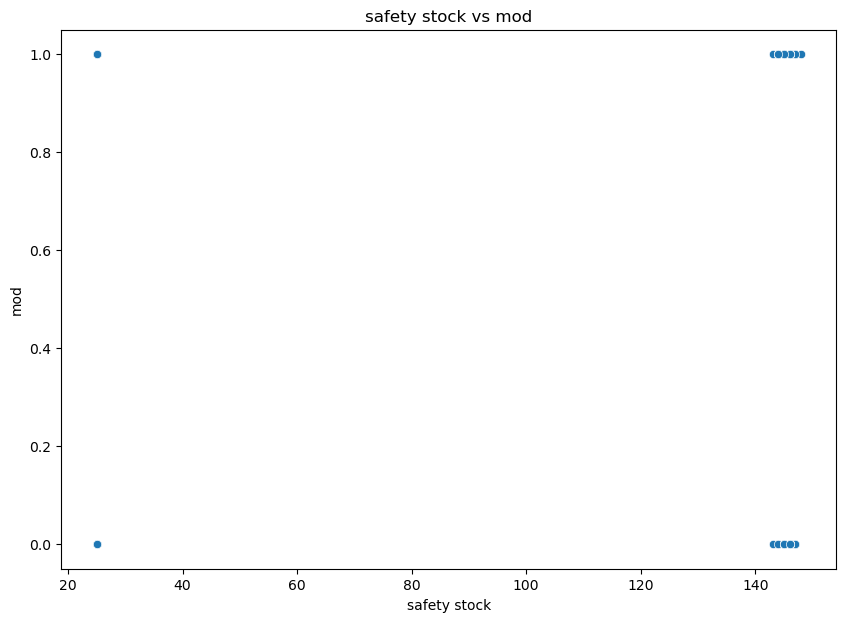

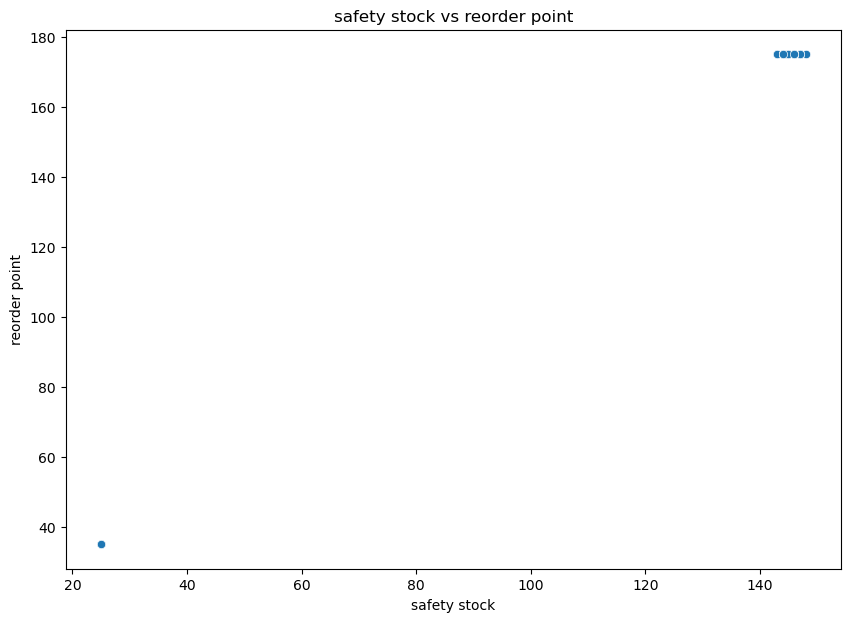

In [32]:
# Bivariate Analysis
for cols1 in invent_data.columns:
    for cols2 in invent_data.columns:
        if cols1 != cols2:
            if invent_data[cols1].dtype != 'object' and invent_data[cols2].dtype != 'object': # for numerical-numerical columns
                plt.figure(figsize=(10,7))
                sns.scatterplot(x=cols1, y=cols2, data = invent_data)
                plt.title(f'{cols1} vs {cols2}')
                plt.show()
            elif invent_data[cols1].dtype != 'object' and invent_data[cols2].dtype == 'object':# for numerical-categorical columns
                plt.figure(figsize=(10,7))
                sns.boxplot(x=cols2, y=cols1, data = invent_data)
                plt.title(f'{cols2} vs {cols1}')
                plt.show()
            elif invent_data[cols1].dtype == 'object' and invent_data[cols2].dtype != 'object':# for categorical-numerical columns
                plt.figure(figsize=(10,7))
                sns.boxplot(x=cols2, y=cols1, data = invent_data)
                plt.title(f'{cols2} vs {cols1}')
                plt.show()
            else:                                                                              # for categorical-categorical columns
                crosstable = pd.crosstab(invent_data[cols1],invent_data[cols2])
                crosstable.plot(kind='bar',stacked =True)
                plt.figure(figsize=(10,7))
                plt.title(f'Stacked Bar Plot {cols1} vs {cols2}')
                plt.show()
                

In [19]:
#5. Find out data related issues based on the data Audit

In [20]:
columns_to_drop = ['Customer Fname','Customer Lname','Customer Street',
                   'Customer Zipcode','Latitude','Longitude']
shipment_data.drop(columns=columns_to_drop,axis=1,inplace=True)

In [21]:
shipment_data.head()

,Product Category Id,Category Name,Class,Customer City,Customer Country,Customer Id,Customer Segment,Customer State,Delivery Status,Department Id,...,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Order Item Total,Order Profit Per Order,Product Price,Sales,Sales per customer
0,24,Women's Apparel,Moderate Value-Moderate Number,Roswell,EE. UU.,5673,Corporate,NM,Late,5,...,0.15,134920,50.0,0.11,2,85.0,9.610000,50.0,100.0,85.0
1,24,Women's Apparel,Moderate Value-Moderate Number,Los Angeles,EE. UU.,9723,Corporate,CA,Late,5,...,0.16,9722,50.0,0.11,2,84.0,9.490000,50.0,100.0,84.0
2,24,Women's Apparel,Moderate Value-Moderate Number,Harvey,EE. UU.,9511,Corporate,IL,Late,5,...,0.06,129954,50.0,0.33,2,94.5,30.709999,50.0,100.0,94.5
3,24,Women's Apparel,Moderate Value-Moderate Number,Elmhurst,EE. UU.,3326,Corporate,IL,Late,5,...,0.05,2929,50.0,0.29,2,95.0,27.549999,50.0,100.0,95.0
4,24,Women's Apparel,Moderate Value-Moderate Number,North Las Vegas,EE. UU.,907,Corporate,NV,Late,5,...,0.05,140056,50.0,0.50,2,95.0,47.500000,50.0,100.0,95.0


In [22]:
shipment_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 40 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Product Category Id            180519 non-null  int64  
 1   Category Name                  180519 non-null  object 
 2   Class                          180519 non-null  object 
 3   Customer City                  180519 non-null  object 
 4   Customer Country               180519 non-null  object 
 5   Customer Id                    180519 non-null  int64  
 6   Customer Segment               180519 non-null  object 
 7   Customer State                 180519 non-null  object 
 8   Delivery Status                180519 non-null  object 
 9   Department Id                  180519 non-null  int64  
 10  Department Name                180519 non-null  object 
 11  Market                         180519 non-null  object 
 12  Order City                    

## Data Preparation

In [23]:
#b. Data Preparation: (Weightage - 15%)
#1.Creat new flag variable Late Delivery Risk based on Days for shipping (real) & Days for shipment (scheduled) (Flag=Not Late if shipment is not delayed and Flag=Late if shipment is delayed)
#2.Rename the variables as per python naming convensions
#3.Convert the variables data types as per the data descriptions
#4.Impute missing values with mean for numerical variables, mode for categorical variables
#5.Perform any other data preparation steps as required?


In [24]:
#1.Creat new flag variable Late Delivery Risk based on Days for shipping (real) & Days for shipment (scheduled) 
#(Flag=Not Late if shipment is not delayed and Flag=Late if shipment is delayed)
shipment_data['Late Delivery Risk']='Not Late'
shipment_data.loc[shipment_data['Days for shipping (real)'] > shipment_data['Days for shipment (scheduled)'],'Late Delivery Risk']= 'Late'

In [25]:
shipment_data.head()

,Product Category Id,Category Name,Class,Customer City,Customer Country,Customer Id,Customer Segment,Customer State,Delivery Status,Department Id,...,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Order Item Total,Order Profit Per Order,Product Price,Sales,Sales per customer,Late Delivery Risk
0,24,Women's Apparel,Moderate Value-Moderate Number,Roswell,EE. UU.,5673,Corporate,NM,Late,5,...,134920,50.0,0.11,2,85.0,9.610000,50.0,100.0,85.0,Late
1,24,Women's Apparel,Moderate Value-Moderate Number,Los Angeles,EE. UU.,9723,Corporate,CA,Late,5,...,9722,50.0,0.11,2,84.0,9.490000,50.0,100.0,84.0,Late
2,24,Women's Apparel,Moderate Value-Moderate Number,Harvey,EE. UU.,9511,Corporate,IL,Late,5,...,129954,50.0,0.33,2,94.5,30.709999,50.0,100.0,94.5,Late
3,24,Women's Apparel,Moderate Value-Moderate Number,Elmhurst,EE. UU.,3326,Corporate,IL,Late,5,...,2929,50.0,0.29,2,95.0,27.549999,50.0,100.0,95.0,Late
4,24,Women's Apparel,Moderate Value-Moderate Number,North Las Vegas,EE. UU.,907,Corporate,NV,Late,5,...,140056,50.0,0.50,2,95.0,47.500000,50.0,100.0,95.0,Late


In [118]:
#2. Rename the variables as per python naming convensions.
# For Shipment data
colms = shipment_data.columns.to_list()
colms

['prod_cat_id',
 'cat_name',
 'class',
 'cust_city',
 'cust_country',
 'cust_id',
 'cust_segment',
 'cust_state',
 'delivery_status',
 'dept_id',
 'dept_name',
 'market',
 'order_city',
 'order_country',
 'order_date',
 'order_id',
 'order_region',
 'order_state',
 'order_status',
 'prod_id',
 'prod_name',
 'shipping_date',
 'shipping_mode',
 'type',
 'benefit_per_order',
 'scheduled_shippment_days',
 'real_shippment_days',
 ' order_cust_id',
 'order_cardprod_id',
 'order_item_discount',
 'order_item_discount_rate',
 'order_item_id',
 'order_item_prod_price',
 'order_item_profit_ratio',
 'order_qty',
 'order_total',
 'order_profit_per_order',
 'prod_price',
 'sales',
 'sales_per_cust',
 'late_delivery_risk',
 'monthly_order',
 'yearly_order',
 'quarterly_order',
 'weekly_order']

In [119]:

new_col_names = {
                'Product Category Id' : 'prod_cat_id',
 'Category Name' : 'cat_name',
 'Class': 'class',
 'Customer City':'cust_city',
 'Customer Country': 'cust_country',
 'Customer Id': 'cust_id',
 'Customer Segment': 'cust_segment',
 'Customer State' : 'cust_state',
 'Delivery Status': 'delivery_status',
 'Department Id' : 'dept_id',
 'Department Name': 'dept_name',
 'Market': 'market',
 'Order City': 'order_city',
 'Order Country' : 'order_country',
 'order date (DateOrders)' : 'order_date',
 'Order Id': 'order_id',
 'Order Region' : 'order_region',
 'Order State' : 'order_state',
 'Order Status' : 'order_status',
 'Product Id' : 'prod_id',
 'Product Name' : 'prod_name',
 'shipping date (DateOrders)': 'shipping_date',
 'Shipping Mode' : 'shipping_mode',
 'Type' : 'type',
 'Benefit per order' : 'benefit_per_order',
 'Days for shipment (scheduled)': 'scheduled_shippment_days',
 'Days for shipping (real)': 'real_shippment_days',
 'Order Customer Id' : ' order_cust_id',
 'Order Item Cardprod Id' : 'order_cardprod_id',
 'Order Item Discount': 'order_item_discount',
 'Order Item Discount Rate' : 'order_item_discount_rate',
 'Order Item Id': 'order_item_id',
 'Order Item Product Price' : 'order_item_prod_price',
 'Order Item Profit Ratio' : 'order_item_profit_ratio',
 'Order Item Quantity': 'order_qty',
 'Order Item Total' : 'order_total',
 'Order Profit Per Order' : 'profit_per_order',
 'Product Price' : 'prod_price',
 'Sales' : 'sales',
 'Sales per customer' : 'sales_per_cust',
 'Late Delivery Risk' : 'late_delivery_risk'
}
shipment_data.rename(columns=new_col_names,inplace=True)

In [163]:
shipment_data.head().T

,0,1,2,3,4
prod_cat_id,24,24,24,24,24
cat_name,Women's Apparel,Women's Apparel,Women's Apparel,Women's Apparel,Women's Apparel
class,Moderate Value-Moderate Number,Moderate Value-Moderate Number,Moderate Value-Moderate Number,Moderate Value-Moderate Number,Moderate Value-Moderate Number
cust_city,Roswell,Los Angeles,Harvey,Elmhurst,North Las Vegas
cust_country,EE. UU.,EE. UU.,EE. UU.,EE. UU.,EE. UU.
cust_id,5673,9723,9511,3326,907
cust_segment,Corporate,Corporate,Corporate,Corporate,Corporate
cust_state,NM,CA,IL,IL,NV
delivery_status,Late,Late,Late,Late,Late
dept_id,5,5,5,5,5


In [121]:
#For Inventory data
colms1 = invent_data.columns.to_list()
colms1

['order_now',
 'prod_id',
 'prod_name',
 'avg_lead_time',
 'avg_order_qty',
 'current_stock',
 'max_lead_time',
 'max_order_qty',
 'mod_val',
 'recorder_pt',
 'safety_stock']

In [30]:
newcols1_names = {
                  'order-now' : 'order_now',
 'product id' : 'prod_id',
 'product name' : 'prod_name',
 'avg lead time' : 'avg_lead_time',
 'avg order qty' : 'avg_order_qty',
 'current stock' : 'current_stock',
 'max lead time' : 'max_lead_time',
 'max order qty' : 'max_order_qty',
 'mod' : 'mod_val',
 'reorder point' : 'recorder_pt',
 'safety stock' : 'safety_stock'
}
invent_data.rename(columns=newcols1_names,inplace=True)

In [31]:
invent_data.head()

,order_now,prod_id,prod_name,avg_lead_time,avg_order_qty,current_stock,max_lead_time,max_order_qty,mod_val,recorder_pt,safety_stock
0,green,19,Nike Men's Fingertrap Max Training Shoe,10,1,69,30,1,1,35,25
1,orange,24,Elevation Training Mask 2.0,10,3,175,30,5,0,175,144
2,green,35,adidas Brazuca 2014 Official Match Ball,10,1,65,30,1,1,35,25
3,green,37,adidas Kids' F5 Messi FG Soccer Cleat,10,3,328,30,5,1,175,146
4,orange,44,adidas Men's F10 Messi TRX FG Soccer Cleat,10,3,175,30,5,0,175,145


In [32]:
#3.Convert the variables data types as per the data descriptions
shipment_data['order_date']=pd.to_datetime(shipment_data['order_date'], format= 'mixed',dayfirst=True)
shipment_data['shipping_date']=pd.to_datetime(shipment_data['shipping_date'], format= 'mixed',dayfirst=True)

In [33]:
shipment_data['shipping_date'].head(10)

0   2017-02-03 17:17:00
1   2015-03-03 00:47:00
2   2017-03-02 04:43:00
3   2015-01-23 04:42:00
4   2017-02-04 17:36:00
5   2017-11-06 15:34:00
6   2017-03-14 07:28:00
7   2017-11-06 15:34:00
8   2017-01-27 00:52:00
9   2015-02-14 16:35:00
Name: shipping_date, dtype: datetime64[ns]

In [34]:
invent_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118 entries, 0 to 117
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   order_now      118 non-null    object
 1   prod_id        118 non-null    int64 
 2   prod_name      118 non-null    object
 3   avg_lead_time  118 non-null    int64 
 4   avg_order_qty  118 non-null    int64 
 5   current_stock  118 non-null    int64 
 6   max_lead_time  118 non-null    int64 
 7   max_order_qty  118 non-null    int64 
 8   mod_val        118 non-null    int64 
 9   recorder_pt    118 non-null    int64 
 10  safety_stock   118 non-null    int64 
dtypes: int64(9), object(2)
memory usage: 10.3+ KB


In [35]:
#4.Impute missing values with mean for numerical variables, mode for categorical variables
shipment_data.isnull().sum().sum()

0

In [36]:
invent_data.isnull().sum().sum()

0

## Analysis 

In [40]:
#1. Caclulate high level metrics like, total sale value, total sale units, inventory value, inventory quantity, profit value, 
#number of distinct products, number of distinct categories, number of distinct products etc

In [41]:
#Total Sales value
total_sales = shipment_data['sales'].sum()
print(f'Total Sales Value is : {total_sales}')


Total Sales Value is : 36784735.01337984


In [42]:
# Total Sale Units
sales_units = shipment_data['order_qty'].sum()
print(f'Total Sales Units is : {sales_units}')

Total Sales Units is : 384079


In [43]:
# Inventory Value
# Please see Q10. as I aggregated data after combining two columns

In [44]:
# Inventory quantity
inventory_qty = invent_data['current_stock'].sum()
print(f'Inventory Quantity is : {inventory_qty}')

Inventory Quantity is : 18965


In [122]:
# Profit value
shipment_data['total_profit']=shipment_data['order_profit_per_order'] * shipment_data['order_qty']
total_profit_value = shipment_data['total_profit'].sum()
total_profit_value

8870218.389888607

In [45]:
#number of distinct products
no_products = shipment_data['prod_name'].nunique()
print(f'Number of distinct products are :{no_products}')

Number of distinct products are :118


In [46]:
#number of distinct categories
no_categories = shipment_data['cat_name'].nunique()
print(f'Number of distinct categories are :{no_categories}')

Number of distinct categories are :50


In [47]:
shipment_data['prod_name'].describe()

count                               180519
unique                                 118
top       Perfect Fitness Perfect Rip Deck
freq                                 24515
Name: prod_name, dtype: object

In [50]:
#2.Status of orders (number of orders by current status)
no_orders = shipment_data['order_status'].value_counts()
print(no_orders)

order_status
Complete           59491
Pending Payment    39832
Processing         21902
Pending            20227
Closed             19616
On Hold             9804
Suspected Fraud     4062
Canceled            3692
Payment Review      1893
Name: count, dtype: int64


In [56]:
#3.Status of Delivery of orders (number of orders by each type of delivery status)
no_delivery_orders = shipment_data['delivery_status'].value_counts()
print(no_delivery_orders)

delivery_status
Late        98977
Advance     41592
On time     32196
Canceled     7754
Name: count, dtype: int64


In [75]:
#4.Late Delivery Risk by time (by each week, month, year, quarter)
#Weekly Late Delivery Risk
shipment_data['weekly_order']=shipment_data['order_date'].dt.to_period('W')
week_late_delivery = shipment_data.groupby(['weekly_order','late_delivery_risk'])['late_delivery_risk'].count().unstack().fillna(0)
week_late_delivery

late_delivery_risk,Late,Not Late
weekly_order,,
2014-12-29/2015-01-04,423,318
2015-01-05/2015-01-11,665,545
2015-01-12/2015-01-18,691,491
2015-01-19/2015-01-25,674,531
2015-01-26/2015-02-01,666,542
...,...,...
2018-07-30/2018-08-05,41,28
2018-08-27/2018-09-02,44,24
2018-10-01/2018-10-07,41,28


In [68]:
#Monthly Late Delivery Risk :
shipment_data['monthly_order']=shipment_data['order_date'].dt.to_period('M')
monthly_late_delivery = shipment_data.groupby(['monthly_order','late_delivery_risk'])['late_delivery_risk'].count().unstack().fillna(0)
monthly_late_delivery

late_delivery_risk,Late,Not Late
monthly_order,,
2015-01,3055,2337
2015-02,2704,2111
2015-03,3035,2287
2015-04,2992,2124
2015-05,3122,2246
2015-06,2912,2251
2015-07,3018,2263
2015-08,3069,2208
2015-09,3019,2141


In [69]:
#Yearly Late Delivery Risk :
shipment_data['yearly_order']=shipment_data['order_date'].dt.to_period('Y')
yearly_late_delivery = shipment_data.groupby(['yearly_order','late_delivery_risk'])['late_delivery_risk'].count().unstack().fillna(0)
yearly_late_delivery


late_delivery_risk,Late,Not Late
yearly_order,,
2015,35877,26773
2016,35841,26709
2017,30436,22760
2018,1246,877


In [74]:
#Quarterly Late Delivery Risk :
shipment_data['quarterly_order']=shipment_data['order_date'].dt.to_period('Q')
quarterly_late_delivery = shipment_data.groupby(['quarterly_order','late_delivery_risk'])['late_delivery_risk'].count().unstack().fillna(0)
quarterly_late_delivery


late_delivery_risk,Late,Not Late
quarterly_order,,
2015Q1,8794,6735
2015Q2,9026,6621
2015Q3,9106,6612
2015Q4,8951,6805
2016Q1,8928,6560
2016Q2,8908,6505
2016Q3,8780,7001
2016Q4,9225,6643
2017Q1,8458,6347


In [95]:
#5.Order Item qty by time (by each week, month, year, quarter)
#Weekly Order Item Qty
week_order_qty = shipment_data.groupby('weekly_order')['order_qty'].sum().fillna(0)
week_order_qty

weekly_order
2014-12-29/2015-01-04    1592
2015-01-05/2015-01-11    2703
2015-01-12/2015-01-18    2654
2015-01-19/2015-01-25    2731
2015-01-26/2015-02-01    2653
                         ... 
2018-07-30/2018-08-05      69
2018-08-27/2018-09-02      68
2018-10-01/2018-10-07      69
2018-10-29/2018-11-04      68
2018-11-26/2018-12-02      69
Freq: W-SUN, Name: order_qty, Length: 172, dtype: int64

In [96]:
#Monthly Order Item Qty
monthly_order_qty = shipment_data.groupby('monthly_order')['order_qty'].sum().fillna(0)
monthly_order_qty

monthly_order
2015-01    11979
2015-02    10674
2015-03    11958
2015-04    11271
2015-05    11883
2015-06    11273
2015-07    11669
2015-08    11604
2015-09    11412
2015-10    11461
2015-11    11309
2015-12    11987
2016-01    11668
2016-02    10723
2016-03    11504
2016-04    11020
2016-05    11591
2016-06    11337
2016-07    11734
2016-08    11455
2016-09    11300
2016-10    11738
2016-11    11576
2016-12    11706
2017-01    11052
2017-02    10160
2017-03    10661
2017-04    10107
2017-05    10343
2017-06     9539
2017-07    10299
2017-08    10125
2017-09     9543
2017-10     4783
2017-11     4767
2017-12     4745
2018-01     1369
2018-02       69
2018-03       68
2018-04       69
2018-05       68
2018-06       69
2018-07       68
2018-08       69
2018-09       68
2018-10       69
2018-11       68
2018-12       69
Freq: M, Name: order_qty, dtype: int64

In [97]:
#Yearly Order Item Qty
yearly_order_qty = shipment_data.groupby('yearly_order')['order_qty'].sum().fillna(0)
yearly_order_qty

yearly_order
2015    138480
2016    137352
2017    106124
2018      2123
Freq: A-DEC, Name: order_qty, dtype: int64

In [98]:
#Quarterly Order Item Qty
quarterly_order_qty = shipment_data.groupby('quarterly_order')['order_qty'].sum().fillna(0)
quarterly_order_qty

quarterly_order
2015Q1    34611
2015Q2    34427
2015Q3    34685
2015Q4    34757
2016Q1    33895
2016Q2    33948
2016Q3    34489
2016Q4    35020
2017Q1    31873
2017Q2    29989
2017Q3    29967
2017Q4    14295
2018Q1     1506
2018Q2      206
2018Q3      205
2018Q4      206
Freq: Q-DEC, Name: order_qty, dtype: int64

In [99]:
#6. Sales units/value  by time (by each week, month, year, quarter)
#Weekly Sales Value
week_sales_value = shipment_data.groupby('weekly_order')['sales'].sum().fillna(0)
week_sales_value

weekly_order
2014-12-29/2015-01-04    143596.382982
2015-01-05/2015-01-11    241799.844630
2015-01-12/2015-01-18    230135.084386
2015-01-19/2015-01-25    241548.304628
2015-01-26/2015-02-01    234879.064484
                             ...      
2018-07-30/2018-08-05      5823.600106
2018-08-27/2018-09-02      5739.200104
2018-10-01/2018-10-07     15070.900047
2018-10-29/2018-11-04     22287.000000
2018-11-26/2018-12-02     22614.750000
Freq: W-SUN, Name: sales, Length: 172, dtype: float64

In [100]:
#Monthly Sales Value
monthly_sales_value = shipment_data.groupby('monthly_order')['sales'].sum().fillna(0)
monthly_sales_value

monthly_order
2015-01    1.062140e+06
2015-02    9.585812e+05
2015-03    1.053320e+06
2015-04    1.012005e+06
2015-05    1.045161e+06
2015-06    1.019744e+06
2015-07    1.030016e+06
2015-08    1.034724e+06
2015-09    1.015010e+06
2015-10    1.034440e+06
2015-11    1.010634e+06
2015-12    1.065056e+06
2016-01    1.038880e+06
2016-02    9.605379e+05
2016-03    1.047824e+06
2016-04    9.788506e+05
2016-05    1.027949e+06
2016-06    1.023834e+06
2016-07    1.057982e+06
2016-08    1.040890e+06
2016-09    1.003261e+06
2016-10    1.049014e+06
2016-11    1.041694e+06
2016-12    1.033101e+06
2017-01    1.037589e+06
2017-02    9.473193e+05
2017-03    9.975099e+05
2017-04    9.857199e+05
2017-05    1.024829e+06
2017-06    9.590545e+05
2017-07    1.017722e+06
2017-08    1.005190e+06
2017-09    1.026180e+06
2017-10    1.250823e+06
2017-11    7.661639e+05
2017-12    7.903350e+05
2018-01    1.547773e+05
2018-02    2.860366e+04
2018-03    1.992672e+04
2018-04    1.712124e+04
2018-05    1.772420e+04
20

In [101]:
#Yearly Sales Value
yearly_sales_value = shipment_data.groupby('yearly_order')['sales'].sum().fillna(0)
yearly_sales_value

yearly_order
2015    1.234083e+07
2016    1.230382e+07
2017    1.180844e+07
2018    3.316501e+05
Freq: A-DEC, Name: sales, dtype: float64

In [102]:
#Quarterly Sales Value
quarterly_sales_value = shipment_data.groupby('quarterly_order')['sales'].sum().fillna(0)
quarterly_sales_value

quarterly_order
2015Q1    3.074042e+06
2015Q2    3.076911e+06
2015Q3    3.079749e+06
2015Q4    3.110130e+06
2016Q1    3.047242e+06
2016Q2    3.030633e+06
2016Q3    3.102133e+06
2016Q4    3.123809e+06
2017Q1    2.982418e+06
2017Q2    2.969604e+06
2017Q3    3.049093e+06
2017Q4    2.807322e+06
2018Q1    2.033077e+05
2018Q2    5.106779e+04
2018Q3    1.730200e+04
2018Q4    5.997265e+04
Freq: Q-DEC, Name: sales, dtype: float64

In [123]:
#7.Profit orders/value  by time (by each week, month, year, quarter)
#Weekly Profit Value
weekly_profit_value = shipment_data.groupby('weekly_order')['total_profit'].sum().fillna(0)
weekly_profit_value

weekly_order
2014-12-29/2015-01-04    32118.220269
2015-01-05/2015-01-11    64014.030102
2015-01-12/2015-01-18    55622.149672
2015-01-19/2015-01-25    54262.820029
2015-01-26/2015-02-01    58731.670267
                             ...     
2018-07-30/2018-08-05      910.579982
2018-08-27/2018-09-02      474.139995
2018-10-01/2018-10-07      159.230038
2018-10-29/2018-11-04     1593.619984
2018-11-26/2018-12-02     1669.900043
Freq: W-SUN, Name: total_profit, Length: 172, dtype: float64

In [124]:
#Monthly Profit Value
monthly_profit_value = shipment_data.groupby('monthly_order')['total_profit'].sum().fillna(0)
monthly_profit_value

monthly_order
2015-01    262420.910380
2015-02    212568.179977
2015-03    297480.999386
2015-04    281562.249386
2015-05    268253.289579
2015-06    247694.750932
2015-07    250876.930097
2015-08    261394.149608
2015-09    259405.310115
2015-10    246182.529616
2015-11    249534.239933
2015-12    268257.429756
2016-01    220132.130685
2016-02    216154.411399
2016-03    240162.470449
2016-04    251075.290293
2016-05    234844.480309
2016-06    279789.219989
2016-07    255520.989985
2016-08    226940.509724
2016-09    285740.519504
2016-10    263421.270031
2016-11    260218.669067
2016-12    246304.209818
2017-01    273919.390302
2017-02    233273.689954
2017-03    263716.700265
2017-04    273152.499750
2017-05    275244.809791
2017-06    230818.540536
2017-07    257759.148900
2017-08    263402.290156
2017-09    228794.560557
2017-10    169612.549596
2017-11    143367.729854
2017-12    137379.450232
2018-01     19737.300013
2018-02      2409.199961
2018-03      2674.420022
2018-04    

In [125]:
#Yearly Profit Value
yearly_profit_value = shipment_data.groupby('yearly_order')['total_profit'].sum().fillna(0)
yearly_profit_value

yearly_order
2015    3.105631e+06
2016    2.980304e+06
2017    2.750441e+06
2018    3.384189e+04
Freq: A-DEC, Name: total_profit, dtype: float64

In [127]:
#Quarterly Profit Value
quarterly_profit_value = shipment_data.groupby('quarterly_order')['total_profit'].sum().fillna(0)
quarterly_profit_value

quarterly_order
2015Q1    772470.089743
2015Q2    797510.289897
2015Q3    771676.389820
2015Q4    763974.199304
2016Q1    676449.012533
2016Q2    765708.990591
2016Q3    768202.019212
2016Q4    769944.148917
2017Q1    770909.780522
2017Q2    779215.850077
2017Q3    749955.999614
2017Q4    450359.729682
2018Q1     24820.919996
2018Q2      3909.839929
2018Q3      1688.379988
2018Q4      3422.750065
Freq: Q-DEC, Name: total_profit, dtype: float64

In [138]:
#8.Order profit per order  by time (by each week, month, year, quarter)
#Weekly Order profit per order
weekly_order_profit_per_order = shipment_data.groupby('weekly_order')['order_profit_per_order'].sum().fillna(0)
weekly_order_profit_per_order

weekly_order
2014-12-29/2015-01-04    16430.370099
2015-01-05/2015-01-11    22900.680218
2015-01-12/2015-01-18    22600.209868
2015-01-19/2015-01-25    23286.350031
2015-01-26/2015-02-01    25073.490106
                             ...     
2018-07-30/2018-08-05      910.579982
2018-08-27/2018-09-02      474.139995
2018-10-01/2018-10-07      159.230038
2018-10-29/2018-11-04     1593.619984
2018-11-26/2018-12-02     1669.900043
Freq: W-SUN, Name: order_profit_per_order, Length: 172, dtype: float64

In [139]:
#Monthly Order profit per order
monthly_order_profit_per_order = shipment_data.groupby('monthly_order')['order_profit_per_order'].sum().fillna(0)
monthly_order_profit_per_order

monthly_order
2015-01    108998.250347
2015-02     96242.020132
2015-03    118379.759963
2015-04    121541.540020
2015-05    116461.360071
2015-06    106167.710329
2015-07    106917.089843
2015-08    113816.550196
2015-09    107726.140179
2015-10    105896.180242
2015-11    101260.900046
2015-12    115449.399904
2016-01    103083.450245
2016-02     92772.940451
2016-03    108122.900376
2016-04    103797.619885
2016-05    105466.300407
2016-06    113416.829883
2016-07    119788.760244
2016-08    106064.480161
2016-09    114807.499977
2016-10    121662.310131
2016-11    113133.249857
2016-12    108002.729854
2017-01    117265.320256
2017-02     95721.750024
2017-03    113779.590056
2017-04    115230.830120
2017-05    116430.340091
2017-06    101819.470342
2017-07    115225.449809
2017-08    119022.710248
2017-09    104503.660342
2017-10    130565.850036
2017-11     86451.600062
2017-12     88068.539946
2018-01     19737.300013
2018-02      2409.199961
2018-03      2674.420022
2018-04    

In [140]:
#Yearly Order profit per order
yearly_order_profit_per_order = shipment_data.groupby('yearly_order')['order_profit_per_order'].sum().fillna(0)
yearly_order_profit_per_order

yearly_order
2015    1.318857e+06
2016    1.310119e+06
2017    1.304085e+06
2018    3.384189e+04
Freq: A-DEC, Name: order_profit_per_order, dtype: float64

In [141]:
#Quarterly Order profit per order
quarterly_order_profit_per_order = shipment_data.groupby('quarterly_order')['order_profit_per_order'].sum().fillna(0)
quarterly_order_profit_per_order

quarterly_order
2015Q1    323620.030441
2015Q2    344170.610420
2015Q3    328459.780218
2015Q4    322606.480191
2016Q1    303979.291072
2016Q2    322680.750175
2016Q3    340660.740382
2016Q4    342798.289843
2017Q1    326766.660336
2017Q2    333480.640552
2017Q3    338751.820399
2017Q4    305085.990044
2018Q1     24820.919996
2018Q2      3909.839929
2018Q3      1688.379988
2018Q4      3422.750065
Freq: Q-DEC, Name: order_profit_per_order, dtype: float64

In [153]:
#9.Order count by country/state/  by time (by each week, month, year, quarter)
# Weekly Order Count for country
Weekly_order_country = shipment_data.groupby(['order_country','weekly_order']).size().unstack().fillna(0)
print(Weekly_order_country)
# Weekly Order Count for state
Weekly_order_state = shipment_data.groupby(['order_state','weekly_order']).size().unstack().fillna(0)
print(Weekly_order_state)

weekly_order   2014-12-29/2015-01-04  2015-01-05/2015-01-11  \
order_country                                                 
Afganistán                       0.0                    0.0   
Albania                          0.0                    0.0   
Alemania                         0.0                  167.0   
Angola                           0.0                    0.0   
Arabia Saudí                     0.0                    0.0   
...                              ...                    ...   
Vietnam                          0.0                    0.0   
Yemen                            0.0                    0.0   
Yibuti                           0.0                    0.0   
Zambia                           0.0                    0.0   
Zimbabue                         0.0                    0.0   

weekly_order   2015-01-12/2015-01-18  2015-01-19/2015-01-25  \
order_country                                                 
Afganistán                       0.0                  

In [154]:
# Monthly Order Count for country
monthly_order_country = shipment_data.groupby(['order_country','monthly_order']).size().unstack().fillna(0)
print(monthly_order_country)
# Monthly Order Count for state
monthly_order_state = shipment_data.groupby(['order_state','monthly_order']).size().unstack().fillna(0)
print(monthly_order_state)

monthly_order  2015-01  2015-02  2015-03  2015-04  2015-05  2015-06  2015-07  \
order_country                                                                  
Afganistán         0.0      5.0      0.0      0.0     17.0      0.0      0.0   
Albania            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
Alemania         167.0    145.0    251.0    234.0    232.0    865.0    799.0   
Angola             0.0      0.0      0.0      0.0      0.0      0.0      0.0   
Arabia Saudí       0.0      0.0      0.0      0.0      0.0      0.0      0.0   
...                ...      ...      ...      ...      ...      ...      ...   
Vietnam            5.0      0.0      6.0      0.0     27.0     16.0      0.0   
Yemen              0.0      0.0      0.0      0.0      0.0      0.0      0.0   
Yibuti             0.0      0.0      0.0      0.0      0.0      0.0      0.0   
Zambia             0.0      0.0      0.0      0.0      0.0      0.0      0.0   
Zimbabue           0.0      0.0      0.0

In [155]:
# Yearly Order Count for country
yearly_order_country = shipment_data.groupby(['order_country','yearly_order']).size().unstack().fillna(0)
print(yearly_order_country)
# Yearly Order Count for state
yearly_order_state = shipment_data.groupby(['order_state','yearly_order']).size().unstack().fillna(0)
print(yearly_order_state)

yearly_order     2015   2016    2017  2018
order_country                             
Afganistán       43.0   93.0    11.0  16.0
Albania           0.0   27.0    10.0   0.0
Alemania       5142.0    0.0  4422.0   0.0
Angola            0.0  282.0    24.0   0.0
Arabia Saudí      0.0  766.0    94.0   0.0
...               ...    ...     ...   ...
Vietnam         192.0  445.0    64.0  56.0
Yemen             0.0   55.0    16.0   0.0
Yibuti            0.0   29.0     2.0   0.0
Zambia            0.0  234.0    32.0   0.0
Zimbabue          0.0  178.0    12.0   0.0

[164 rows x 4 columns]
yearly_order    2015  2016  2017  2018
order_state                           
Abia             0.0  36.0   0.0   0.0
Abruzos         34.0   0.0  27.0   0.0
Aceh             3.0  13.0   2.0   1.0
Acre            16.0   0.0  20.0   0.0
Adamaoua         0.0  13.0   1.0   0.0
...              ...   ...   ...   ...
iauliai         0.0   8.0   0.0   0.0
ilina           0.0   5.0   0.0   0.0
Çanakkale        0.0   6.0 

In [156]:
# Quarterly Order Count for country
quarterly_order_country = shipment_data.groupby(['order_country','quarterly_order']).size().unstack().fillna(0)
print(quarterly_order_country)
# Quarterly Order Count for state
quarterly_order_state = shipment_data.groupby(['order_state','quarterly_order']).size().unstack().fillna(0)
print(quarterly_order_state)

quarterly_order  2015Q1  2015Q2  2015Q3  2015Q4  2016Q1  2016Q2  2016Q3  \
order_country                                                             
Afganistán          5.0    17.0     3.0    18.0    46.0    39.0     8.0   
Albania             0.0     0.0     0.0     0.0     0.0     0.0     6.0   
Alemania          563.0  1331.0  2339.0   909.0     0.0     0.0     0.0   
Angola              0.0     0.0     0.0     0.0     8.0    14.0    76.0   
Arabia Saudí        0.0     0.0     0.0     0.0   117.0    47.0   204.0   
...                 ...     ...     ...     ...     ...     ...     ...   
Vietnam            11.0    43.0     0.0   138.0   336.0    25.0    29.0   
Yemen               0.0     0.0     0.0     0.0     0.0     0.0    21.0   
Yibuti              0.0     0.0     0.0     0.0     0.0     0.0     0.0   
Zambia              0.0     0.0     0.0     0.0    45.0     1.0    52.0   
Zimbabue            0.0     0.0     0.0     0.0    29.0    10.0    67.0   

quarterly_order  2016Q4 

In [ ]:
#10.Inventory Units by each class or cluster

In [158]:
combined_table = pd.merge(shipment_data,invent_data,on='prod_id', how= 'inner')
combined_table.head(10)

,prod_cat_id,cat_name,class,cust_city,cust_country,cust_id,cust_segment,cust_state,delivery_status,dept_id,...,order_now,prod_name_y,avg_lead_time,avg_order_qty,current_stock,max_lead_time,max_order_qty,mod_val,recorder_pt,safety_stock
0,24,Women's Apparel,Moderate Value-Moderate Number,Roswell,EE. UU.,5673,Corporate,NM,Late,5,...,orange,Nike Men's Dri-FIT Victory Golf Polo,10,3,175,30,5,0,175,146
1,24,Women's Apparel,Moderate Value-Moderate Number,Los Angeles,EE. UU.,9723,Corporate,CA,Late,5,...,orange,Nike Men's Dri-FIT Victory Golf Polo,10,3,175,30,5,0,175,146
2,24,Women's Apparel,Moderate Value-Moderate Number,Harvey,EE. UU.,9511,Corporate,IL,Late,5,...,orange,Nike Men's Dri-FIT Victory Golf Polo,10,3,175,30,5,0,175,146
3,24,Women's Apparel,Moderate Value-Moderate Number,Elmhurst,EE. UU.,3326,Corporate,IL,Late,5,...,orange,Nike Men's Dri-FIT Victory Golf Polo,10,3,175,30,5,0,175,146
4,24,Women's Apparel,Moderate Value-Moderate Number,North Las Vegas,EE. UU.,907,Corporate,NV,Late,5,...,orange,Nike Men's Dri-FIT Victory Golf Polo,10,3,175,30,5,0,175,146
5,24,Women's Apparel,Moderate Value-Moderate Number,Muskegon,EE. UU.,7647,Corporate,MI,Late,5,...,orange,Nike Men's Dri-FIT Victory Golf Polo,10,3,175,30,5,0,175,146
6,24,Women's Apparel,Moderate Value-Moderate Number,Chicago,EE. UU.,7672,Corporate,IL,Late,5,...,orange,Nike Men's Dri-FIT Victory Golf Polo,10,3,175,30,5,0,175,146
7,24,Women's Apparel,Moderate Value-Moderate Number,Muskegon,EE. UU.,7647,Corporate,MI,Late,5,...,orange,Nike Men's Dri-FIT Victory Golf Polo,10,3,175,30,5,0,175,146
8,24,Women's Apparel,Moderate Value-Moderate Number,Hanford,EE. UU.,7733,Corporate,CA,Late,5,...,orange,Nike Men's Dri-FIT Victory Golf Polo,10,3,175,30,5,0,175,146
9,24,Women's Apparel,Moderate Value-Moderate Number,Aurora,EE. UU.,6623,Corporate,CO,Late,5,...,orange,Nike Men's Dri-FIT Victory Golf Polo,10,3,175,30,5,0,175,146


In [162]:
combined_table['total_inventory'] = combined_table['current_stock'] + combined_table['safety_stock']
inventory_units = combined_table.groupby('class')['total_inventory'].sum()
inventory_units

class
High Value-Small Number           19495372
Moderate Value-Moderate Number    10073883
Small Value-Large Number          17597731
Name: total_inventory, dtype: int64

In [340]:
# Inventory value
combined_table['inventory_value'] = combined_table['prod_price'] * combined_table['avg_order_qty']
combined_table['inventory_value'].sum()

36772641.13371421

In [165]:
#11.Inventory Value by each class or cluster
inventory_value_by_class = combined_table.groupby('class')['inventory_value'].sum()
inventory_value_by_class

class
High Value-Small Number           1.911038e+07
Moderate Value-Moderate Number    9.146853e+06
Small Value-Large Number          8.515410e+06
Name: inventory_value, dtype: float64

In [166]:
#12.inventory by class
inventory_by_class = combined_table.groupby('class')['current_stock'].sum()
inventory_by_class

class
High Value-Small Number           13399842
Moderate Value-Moderate Number     6059123
Small Value-Large Number          10919162
Name: current_stock, dtype: int64

In [167]:
#13.Detail Stock Action (products to be ordered, not required to ordered)
stock_action = combined_table.groupby('order_now')['prod_id'].count()
stock_action  # green- not required to ordered & orange= need to be ordered

order_now
green     111094
orange     69425
Name: prod_id, dtype: int64

In [168]:
#14.Product Order qty trend  (by time (by each week, month, year, quarter))
#Weekly trend
weekly_prod_order = shipment_data.groupby('weekly_order')['order_qty'].sum()
weekly_prod_order

weekly_order
2014-12-29/2015-01-04    1592
2015-01-05/2015-01-11    2703
2015-01-12/2015-01-18    2654
2015-01-19/2015-01-25    2731
2015-01-26/2015-02-01    2653
                         ... 
2018-07-30/2018-08-05      69
2018-08-27/2018-09-02      68
2018-10-01/2018-10-07      69
2018-10-29/2018-11-04      68
2018-11-26/2018-12-02      69
Freq: W-SUN, Name: order_qty, Length: 172, dtype: int64

In [169]:
#Monthly trend
monthly_prod_order = shipment_data.groupby('monthly_order')['order_qty'].sum()
monthly_prod_order

monthly_order
2015-01    11979
2015-02    10674
2015-03    11958
2015-04    11271
2015-05    11883
2015-06    11273
2015-07    11669
2015-08    11604
2015-09    11412
2015-10    11461
2015-11    11309
2015-12    11987
2016-01    11668
2016-02    10723
2016-03    11504
2016-04    11020
2016-05    11591
2016-06    11337
2016-07    11734
2016-08    11455
2016-09    11300
2016-10    11738
2016-11    11576
2016-12    11706
2017-01    11052
2017-02    10160
2017-03    10661
2017-04    10107
2017-05    10343
2017-06     9539
2017-07    10299
2017-08    10125
2017-09     9543
2017-10     4783
2017-11     4767
2017-12     4745
2018-01     1369
2018-02       69
2018-03       68
2018-04       69
2018-05       68
2018-06       69
2018-07       68
2018-08       69
2018-09       68
2018-10       69
2018-11       68
2018-12       69
Freq: M, Name: order_qty, dtype: int64

In [170]:
#Yearly trend
yearly_prod_order = shipment_data.groupby('yearly_order')['order_qty'].sum()
yearly_prod_order

yearly_order
2015    138480
2016    137352
2017    106124
2018      2123
Freq: A-DEC, Name: order_qty, dtype: int64

In [171]:
#Quarterly trend
Quarterly_prod_order = shipment_data.groupby('quarterly_order')['order_qty'].sum()
Quarterly_prod_order

quarterly_order
2015Q1    34611
2015Q2    34427
2015Q3    34685
2015Q4    34757
2016Q1    33895
2016Q2    33948
2016Q3    34489
2016Q4    35020
2017Q1    31873
2017Q2    29989
2017Q3    29967
2017Q4    14295
2018Q1     1506
2018Q2      206
2018Q3      205
2018Q4      206
Freq: Q-DEC, Name: order_qty, dtype: int64

In [205]:
#15.Top 10 Most ordered products/Top 10 Most Categories/Top 10 cities in terms of revenue and sale units (quantity)
#Top 10 Most ordered products in terms of revenue and sale units (quantity)
order_products_counts = combined_table.groupby('prod_name_y')[['sales','order_qty']].sum().reset_index()
top10_order_products_counts = order_products_counts.sort_values(by='prod_name_y',ascending=False)
top10_order_products_counts.head(10)

,prod_name_y,sales,order_qty
117,insta-bed Neverflat Air Mattress,8999.400330,60
116,adidas Youth Germany Black/Red Away Match Soc,67830.000000,969
115,adidas Men's Germany Black Crest Away Tee,21475.000000,859
114,adidas Men's F10 Messi TRX FG Soccer Cleat,56330.611645,939
113,adidas Kids' F5 Messi FG Soccer Cleat,27327.190540,781
112,adidas Brazuca 2014 Official Match Ball,10399.350357,65
111,Yakima DoubleDown Ace Hitch Mount 4-Bike Rack,12096.000000,64
110,Web Camera,267607.685032,592
109,Under Armour Women's Micro G Skulpt Running S,46559.591034,847
108,Under Armour Women's Ignite Slide,29398.809778,919


In [206]:
#Top 10 Most Categories in terms of revenue and sale units (quantity)
order_cats_counts = combined_table.groupby('cat_name')[['sales','order_qty']].sum().reset_index()
top10_order_products_counts = order_cats_counts.sort_values(by='cat_name',ascending=False)
top10_order_products_counts.head(10)

,cat_name,sales,order_qty
49,Women's Golf Clubs,4.454597e+04,403
48,Women's Clothing,1.402830e+05,650
47,Women's Apparel,3.147800e+06,62956
46,Water Sports,3.113845e+06,15540
45,Video Games,3.331050e+04,838
44,Trade-In,6.872178e+04,2822
43,Toys,6.104660e+03,529
42,Tennis & Racquet,4.458509e+04,991
41,Strength Training,5.489553e+04,111
40,Sporting Goods,1.170068e+05,357


In [207]:
#Top 10 Most Cities in terms of revenue and sale units (quantity)
cities_counts = combined_table.groupby('order_city')[['sales','order_qty']].sum().reset_index()
top10_cities_counts = cities_counts.sort_values(by='order_city',ascending=False)
top10_cities_counts.head(10)

,order_city,sales,order_qty
3596,Ústí nad Labem,2709.550049,28
3595,Çanakkale,1029.800026,12
3594,Águas Lindas de Goiás,2349.750053,20
3593,eMbalenhle,1279.890026,12
3592,Zwolle,2376.790030,18
3591,Zwickau,2090.790009,24
3590,Zwedru,799.970016,6
3589,Zurich,21904.950411,229
3588,Zunyi,1949.560013,29
3587,Zlatoust,2759.700058,23


In [179]:
#16.Top payment methods by each product category.
payment_counts = combined_table.groupby(['cat_name','type']).size().reset_index(name='count')
top_payment_count = payment_counts.groupby('cat_name').apply(lambda x : x.nlargest(1,'count')).reset_index(drop=True)
top_payment_count

,cat_name,type,count
0,Accessories,DEBIT,692
1,As Seen on TV!,DEBIT,24
2,Baby,DEBIT,81
3,Baseball & Softball,DEBIT,235
4,Basketball,TRANSFER,25
5,Books,DEBIT,142
6,Boxing & MMA,DEBIT,154
7,CDs,DEBIT,112
8,Cameras,DEBIT,224
9,Camping & Hiking,DEBIT,5255


In [185]:
#17.Which shipping mode is more efficient interms of not delaying?
notlate_shipping = combined_table[combined_table['late_delivery_risk']=='Not Late']
notlate_shipping_mode_count = notlate_shipping.groupby('shipping_mode').size().reset_index(name='not_late_count')
notlate_shipping_mode_count
efficient_shipping_mode = notlate_shipping_mode_count.groupby('shipping_mode').apply(lambda y : y.nlargest(1,'not_late_count')).reset_index(drop=True)
efficient_shipping_mode

,shipping_mode,not_late_count
0,Same Day,5080
1,Second Class,7138
2,Standard Class,64901


In [187]:
#18.Number of orders, sales, qty  by order status
#Number of Orders by order status
no_of_orders = combined_table.groupby('order_status')['order_id'].size()
no_of_orders

order_status
Canceled            3692
Closed             19616
Complete           59491
On Hold             9804
Payment Review      1893
Pending            20227
Pending Payment    39832
Processing         21902
Suspected Fraud     4062
Name: order_id, dtype: int64

In [188]:
#Sales by order status
sales_order_status = combined_table.groupby('order_status')['sales'].sum()
sales_order_status

order_status
Canceled           7.443704e+05
Closed             4.022624e+06
Complete           1.209531e+07
On Hold            1.981543e+06
Payment Review     3.836537e+05
Pending            4.120533e+06
Pending Payment    8.106698e+06
Processing         4.504064e+06
Suspected Fraud    8.259350e+05
Name: sales, dtype: float64

In [189]:
#Quantity by order status
qty_order_status = combined_table.groupby('order_status')['order_qty'].sum()
qty_order_status

order_status
Canceled             7875
Closed              41458
Complete           126624
On Hold             20845
Payment Review       4109
Pending             43196
Pending Payment     84736
Processing          46623
Suspected Fraud      8613
Name: order_qty, dtype: int64

In [192]:
combined_table.head().T

,0,1,2,3,4
prod_cat_id,24,24,24,24,24
cat_name,Women's Apparel,Women's Apparel,Women's Apparel,Women's Apparel,Women's Apparel
class,Moderate Value-Moderate Number,Moderate Value-Moderate Number,Moderate Value-Moderate Number,Moderate Value-Moderate Number,Moderate Value-Moderate Number
cust_city,Roswell,Los Angeles,Harvey,Elmhurst,North Las Vegas
cust_country,EE. UU.,EE. UU.,EE. UU.,EE. UU.,EE. UU.
cust_id,5673,9723,9511,3326,907
cust_segment,Corporate,Corporate,Corporate,Corporate,Corporate
cust_state,NM,CA,IL,IL,NV
delivery_status,Late,Late,Late,Late,Late
dept_id,5,5,5,5,5


In [191]:
#19.Which categories are most profitable categories (top5)?
profit_per_cat = combined_table.groupby('cat_name')['total_profit'].sum().reset_index()
top5_cat_by_profit = profit_per_cat.sort_values(by='total_profit',ascending=False)
top5_cat_by_profit.head(5)

,cat_name,total_profit
12,Cleats,1.799003e+06
10,Cardio Equipment,1.392871e+06
47,Women's Apparel,1.293439e+06
30,Indoor/Outdoor Games,1.158835e+06
18,Fishing,7.562208e+05


In [196]:
#20.Which categoires have been given highest average discount (top5)?
avg_discount_by_cat = combined_table.groupby('cat_name')['order_item_discount'].mean().reset_index()
top5_avg_discount_by_cat = avg_discount_by_cat.sort_values(by='order_item_discount',ascending=False)
top5_avg_discount_by_cat.head(5)

,cat_name,order_item_discount
13,Computers,152.952489
41,Strength Training,54.790270
20,Garden,53.726280
15,Crafts,46.800517
8,Cameras,45.795609


In [211]:
#21.Geographical distribution of total revenue generated
market_by_sales = combined_table.groupby('market')['sales'].sum()
sorting_acc_to_sales =market_by_sales.sort_values(ascending=False)
sorting_acc_to_sales

market
Europe          1.087240e+07
LATAM           1.027761e+07
Pacific Asia    8.273744e+06
USCA            5.066529e+06
Africa          2.294453e+06
Name: sales, dtype: float64

In [214]:
#22.Top 10 cities in USCA market
top_10_cities_USCA =combined_table[combined_table['market'] == 'USCA'].groupby('order_city')['sales'].sum().nlargest(10)
top_10_cities_USCA

order_city
New York City    436061.538159
Los Angeles      370545.137497
San Francisco    256245.625345
Philadelphia     255914.244948
Seattle          206658.243978
Houston          174961.623578
Chicago          154542.253189
Columbus         112520.612342
San Diego         87113.191835
Springfield       72781.071459
Name: sales, dtype: float64

In [219]:
#23.Payment Method Distribution in Asia-Pacific Region
transaction_type_in_Asia =combined_table[combined_table['market'] == 'Pacific Asia'].groupby('type')['sales'].sum()
transaction_type_in_Asia

type
CASH        9.124428e+05
DEBIT       3.128247e+06
PAYMENT     1.968063e+06
TRANSFER    2.264991e+06
Name: sales, dtype: float64

In [221]:
#24.How many products ordered according to recorder point
count_products_recorder_pt = combined_table.groupby('recorder_pt')['prod_id'].size().reset_index()
count_products_recorder_pt

,recorder_pt,prod_id
0,35,78709
1,175,101810


In [223]:
#25.Department wise sales
sales_per_dept = combined_table.groupby('dept_name')['sales'].sum().reset_index()
sales_by_dept = sales_per_dept.sort_values(by='sales',ascending=False)
print(sales_by_dept)

            dept_name         sales
3            Fan Shop  1.711387e+07
0             Apparel  7.976255e+06
6                Golf  4.609028e+06
5            Footwear  4.006499e+06
8            Outdoors  1.253351e+06
10         Technology  1.039599e+06
4             Fitness  3.970509e+05
2          Discs Shop  2.288877e+05
7   Health and Beauty  1.060805e+05
9            Pet Shop  4.152480e+04
1           Book Shop  1.258740e+04


### Create Visulization of the Analysis

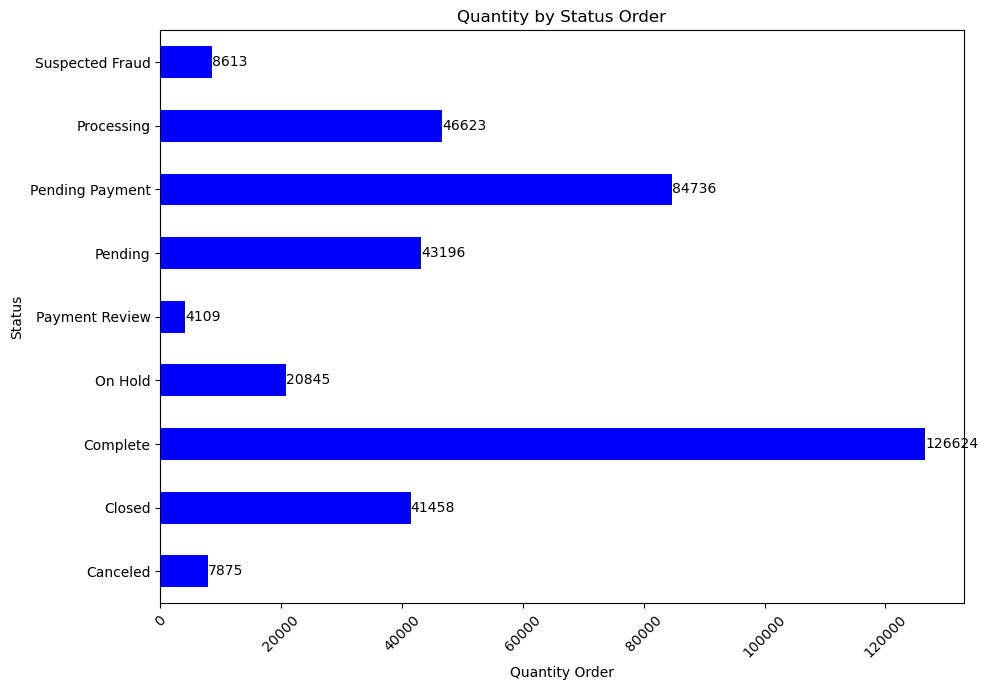

In [339]:
# Yearly Profit
# Create a bar chart
plt.figure(figsize=(10, 7))
ax=qty_order_status.plot(kind='barh', color='blue')
for i in ax.containers:
    ax.bar_label(i,)
plt.title('Quantity by Status Order')
plt.xlabel('Quantity Order')
plt.ylabel('Status')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the bar chart
plt.show()

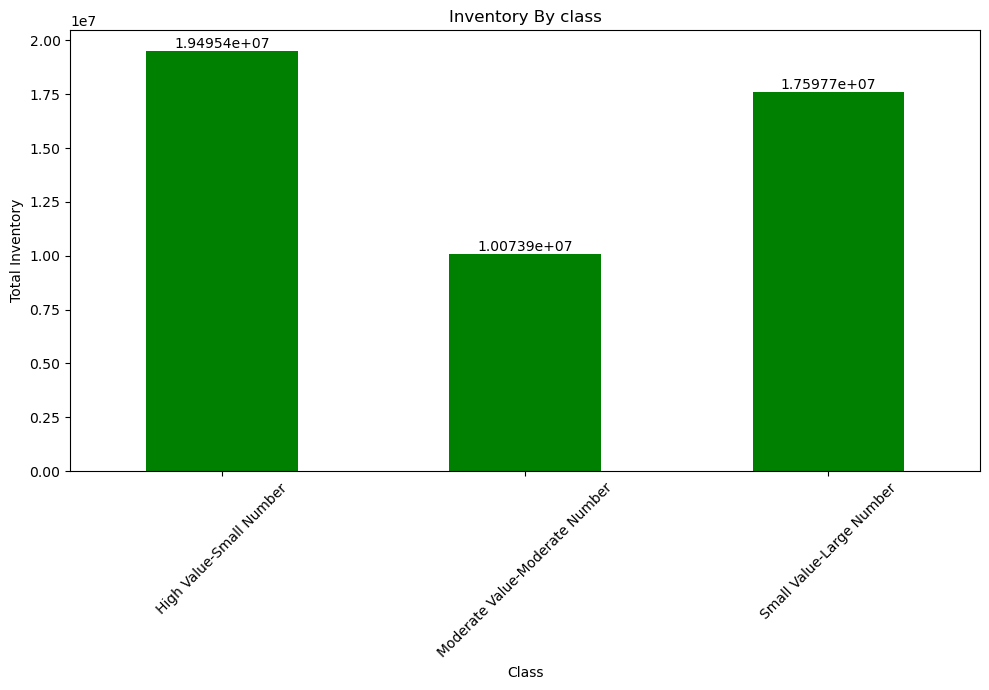

In [288]:
# Inventory By class
inventory_by_class =combined_table.groupby('class')['total_inventory'].sum()
# Create a bar chart
plt.figure(figsize=(10, 7))
ax=inventory_by_class.plot(kind='bar', color='green')
for i in ax.containers:
    ax.bar_label(i,)
plt.title('Inventory By class')
plt.xlabel('Class')
plt.ylabel('Total Inventory')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the bar chart
plt.show()

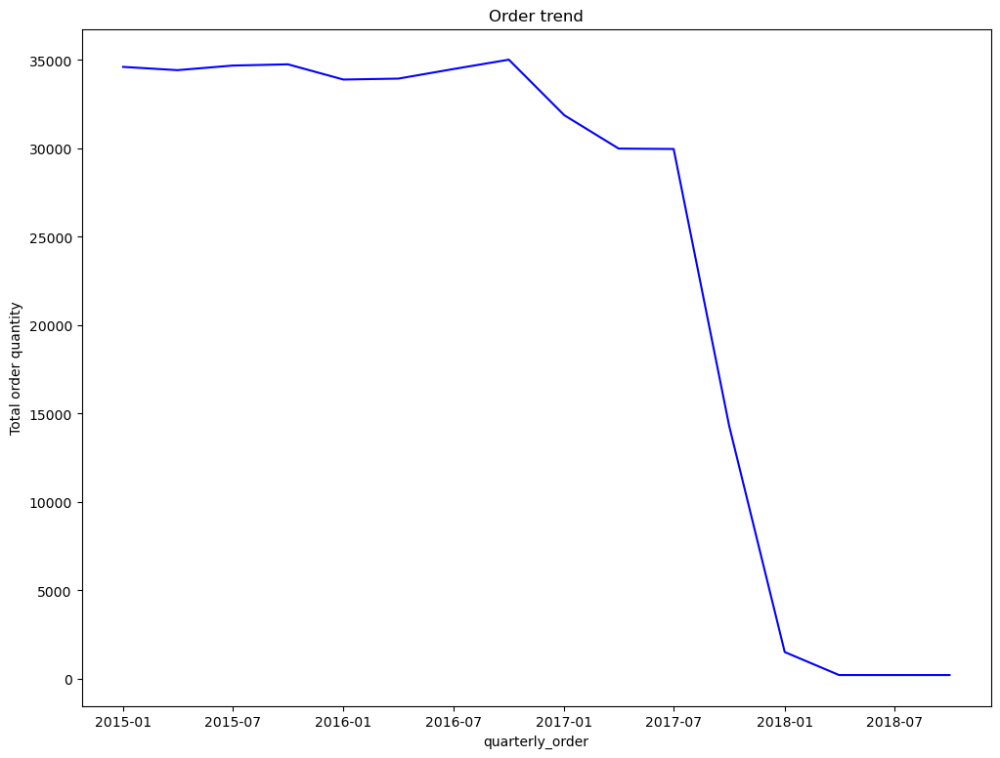

In [284]:
# Quarterly order quantity
plt.figure(figsize=(12,9))
sum_order_qty = combined_table.groupby('quarterly_order')['order_qty'].sum().reset_index()
sns.lineplot(data=sum_order_qty,x='quarterly_order',y='order_qty',ci=None,color='blue')
plt.xlabel('quarterly_order')
plt.ylabel('Total order quantity')
plt.title('Order trend')
plt.show()

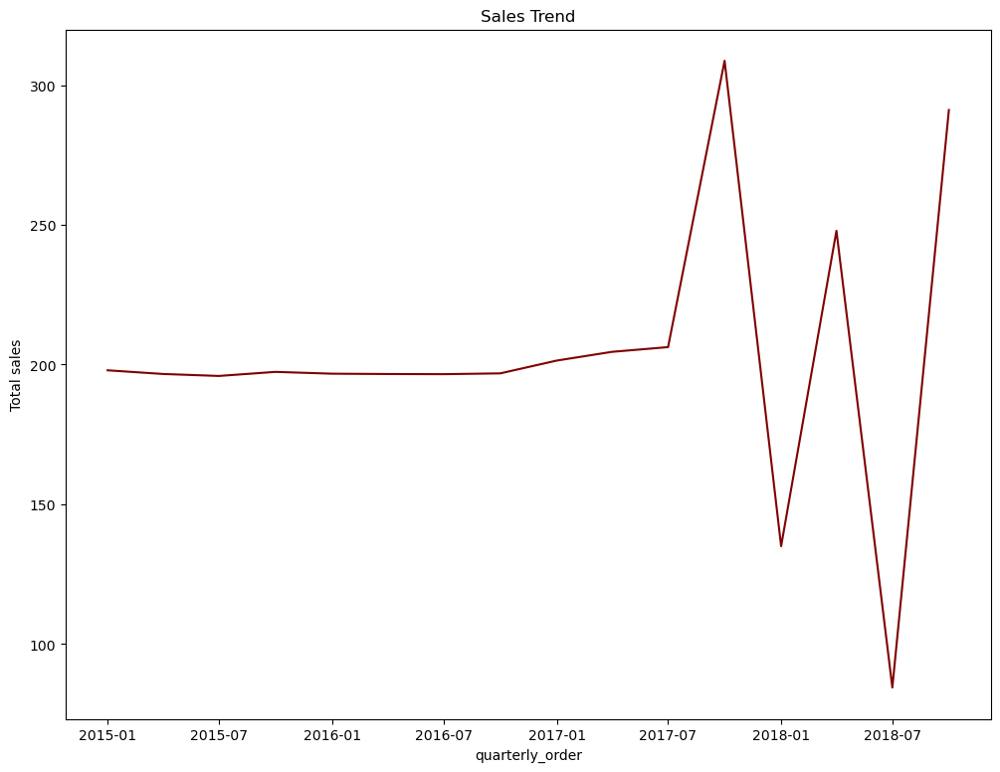

In [281]:
# Quarterly sales
plt.figure(figsize=(12,9))
sns.lineplot(data=combined_table,x='quarterly_order',y='sales',ci=None,color='maroon')
plt.xlabel('quarterly_order')
plt.ylabel('Total sales')
plt.title('Sales Trend')
plt.show()

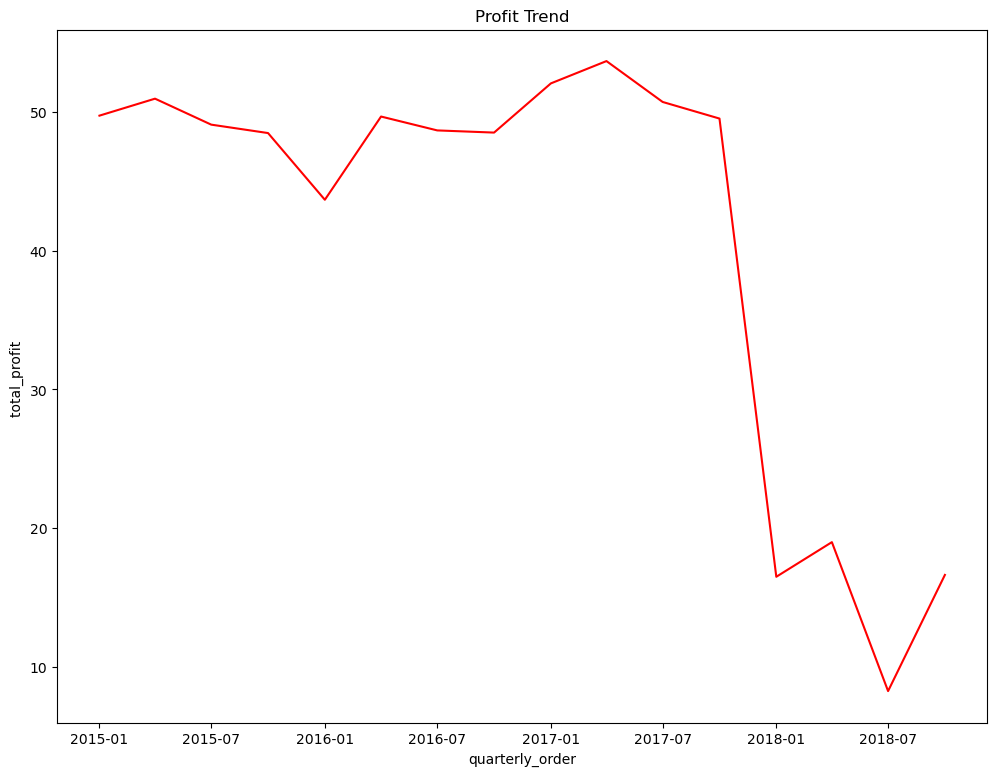

In [285]:
# Quarterly profit
plt.figure(figsize=(12,9))
sns.lineplot(data=combined_table,x='quarterly_order',y='total_profit',ci=None,color='red')
plt.xlabel('quarterly_order')
plt.ylabel('total_profit ')
plt.title('Profit Trend')
plt.show()

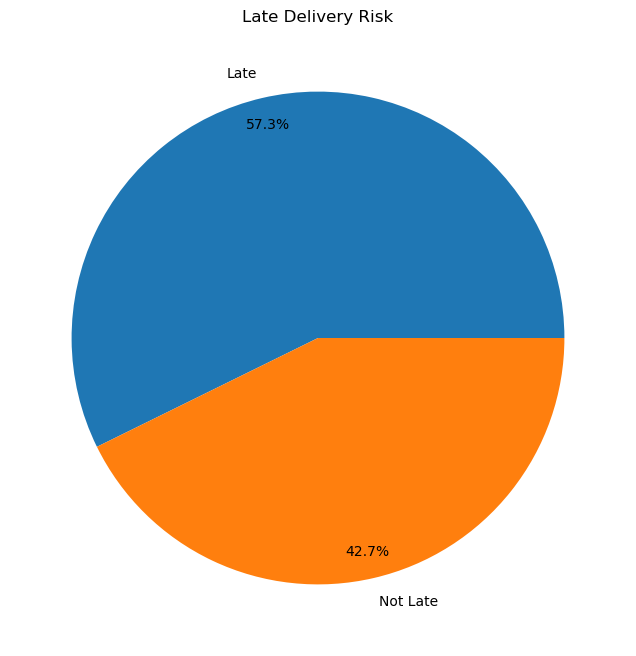

In [274]:
# Pie chart for Late Delivery Risk
#Pie chart
plt.figure(figsize=(8,8))
plt.pie(combined_table.groupby('late_delivery_risk')['order_id'].count(),
        labels=combined_table.groupby('late_delivery_risk')['order_id'].count().index,
        autopct='%1.1f%%',
        pctdistance=0.89 )
plt.title('Late Delivery Risk')
plt.show()

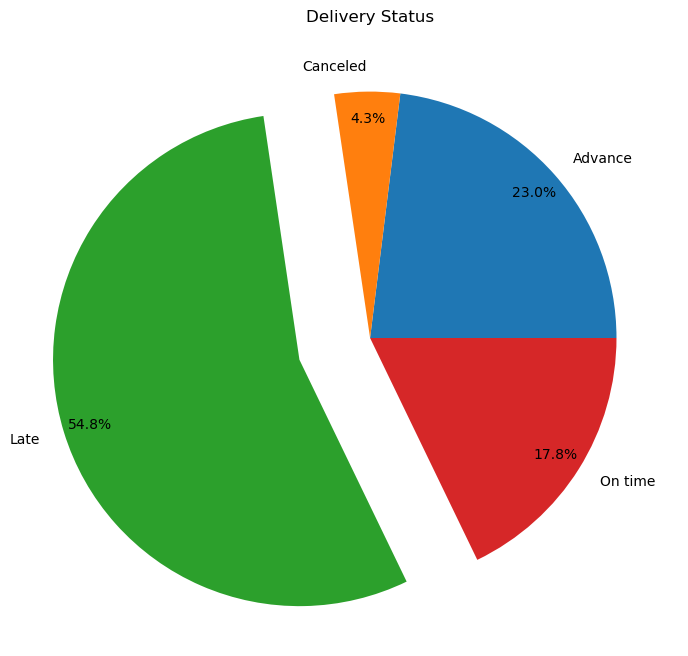

In [279]:
 # Pie chart for Delivery Status
#Pie chart
plt.figure(figsize=(8,8))
plt.pie(combined_table.groupby('delivery_status')['order_id'].count(),
        labels=combined_table.groupby('delivery_status')['order_id'].count().index,
        autopct='%1.1f%%',
        pctdistance=0.89, explode = ((0,0,0.3,0)) )
       
plt.title('Delivery Status')
plt.show()

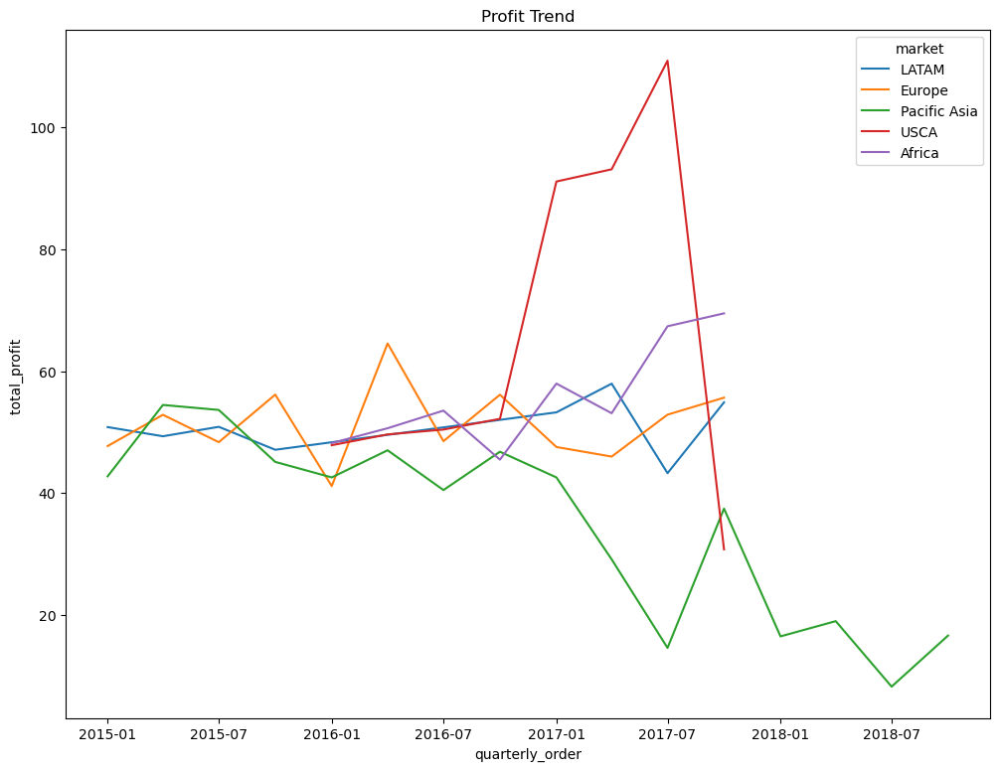

In [280]:
# Quarterly profit within market 
plt.figure(figsize=(12,9))
sns.lineplot(data=combined_table,x='quarterly_order',y='total_profit',hue='market',ci=None,color='red')
plt.xlabel('quarterly_order')
plt.ylabel('total_profit ')
plt.title('Profit Trend within market')
plt.show()

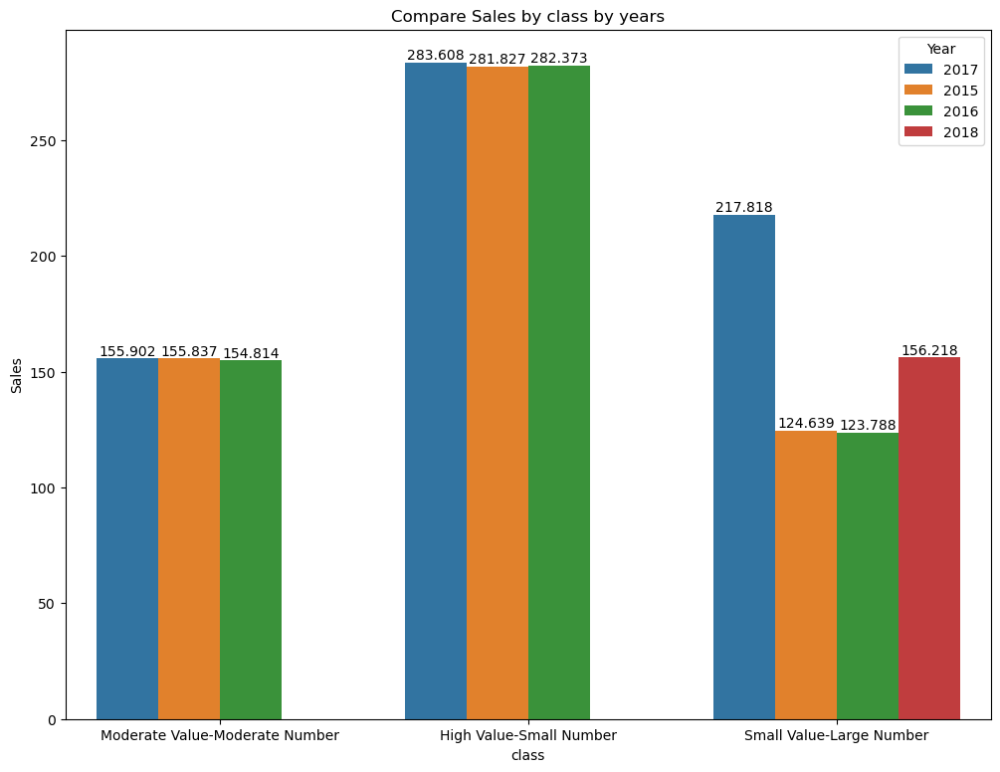

In [258]:
#1.Compare Sales by class by years using bar chart

# Plotting the bar chart
plt.figure(figsize=(12,9))
ax=sns.barplot(data=combined_table, x='class',y='sales',hue='yearly_order',ci=None)
for i in ax.containers:
    ax.bar_label(i,)
plt.xlabel('class')
plt.ylabel('Sales')
plt.legend(title='Year')
plt.title('Compare Sales by class by years')
plt.show()

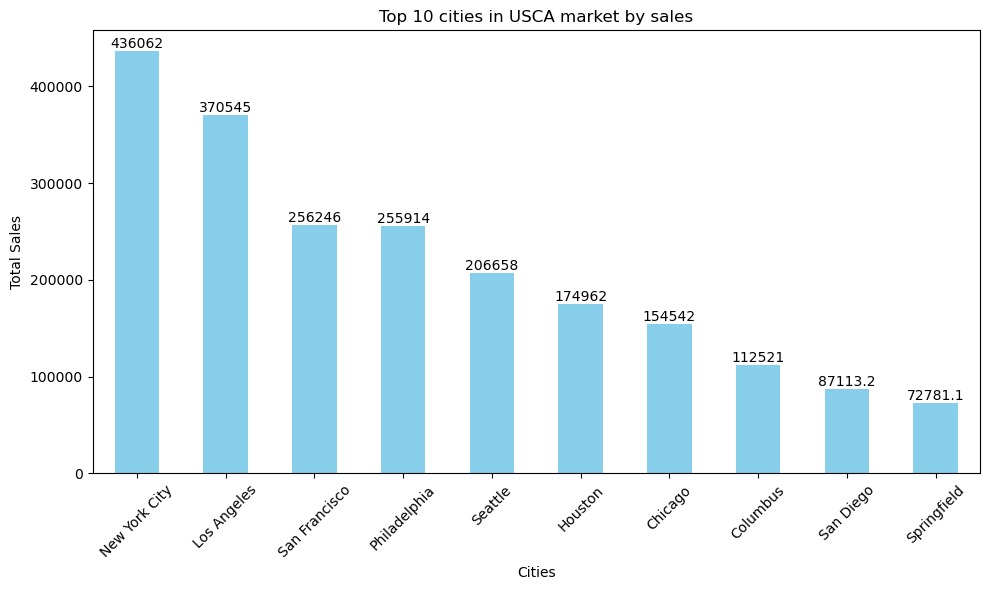

In [287]:
#Top 10 cities in USCA market by sales

# Sort values to find the top 10 countries with the most quantity ordered
top_10_cities_USCA =combined_table[combined_table['market'] == 'USCA'].groupby('order_city')['sales'].sum().nlargest(10)

# Create a bar chart
plt.figure(figsize=(10, 6))
ax=top_10_cities_USCA.plot(kind='bar', color='skyblue')
for i in ax.containers:
    ax.bar_label(i,)
plt.title('Top 10 cities in USCA market by sales')
plt.xlabel('Cities')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the bar chart
plt.show()

### e. Predictive modeling 

In [290]:
combined_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 58 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   prod_cat_id               180519 non-null  int64         
 1   cat_name                  180519 non-null  object        
 2   class                     180519 non-null  object        
 3   cust_city                 180519 non-null  object        
 4   cust_country              180519 non-null  object        
 5   cust_id                   180519 non-null  int64         
 6   cust_segment              180519 non-null  object        
 7   cust_state                180519 non-null  object        
 8   delivery_status           180519 non-null  object        
 9   dept_id                   180519 non-null  int64         
 10  dept_name                 180519 non-null  object        
 11  market                    180519 non-null  object        
 12  or

In [307]:
combined_table['no_days_delayed']=combined_table['real_shippment_days']-combined_table['scheduled_shippment_days']
combined_table['no_days_delayed'].describe()

count    180519.000000
mean          0.565807
std           1.490966
min          -2.000000
25%           0.000000
50%           1.000000
75%           1.000000
max           4.000000
Name: no_days_delayed, dtype: float64

In [308]:
selected_cols = ['cust_id','sales','order_qty','total_inventory','inventory_value','order_profit_per_order',
                 'order_item_profit_ratio','order_item_discount','no_days_delayed']
df=combined_table[selected_cols].copy()
df

,cust_id,sales,order_qty,total_inventory,inventory_value,order_profit_per_order,order_item_profit_ratio,order_item_discount,no_days_delayed
0,5673,100.00000,2,321,150.00000,9.610000,0.11,15.0,2
1,9723,100.00000,2,321,150.00000,9.490000,0.11,16.0,2
2,9511,100.00000,2,321,150.00000,30.709999,0.33,5.5,3
3,3326,100.00000,2,321,150.00000,27.549999,0.29,5.0,3
4,907,100.00000,2,321,150.00000,47.500000,0.50,5.0,3
...,...,...,...,...,...,...,...,...,...
180514,182,349.98999,1,94,349.98999,110.250000,0.35,35.0,4
180515,1464,349.98999,1,94,349.98999,133.979996,0.44,45.5,1
180516,6368,349.98999,1,94,349.98999,-60.540001,-0.19,24.5,1
180517,9072,349.98999,1,94,349.98999,-758.599976,-2.55,52.5,1


In [309]:
df.describe(include='all')

,cust_id,sales,order_qty,total_inventory,inventory_value,order_profit_per_order,order_item_profit_ratio,order_item_discount,no_days_delayed
count,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000
mean,6691.379495,203.772096,2.127638,261.285438,203.705101,21.974989,0.120647,20.664741,0.565807
std,4162.918106,132.273077,1.453451,168.333947,116.473969,104.433526,0.466796,21.800901,1.490966
min,1.000000,9.990000,1.000000,60.000000,11.290000,-4274.979980,-2.750000,0.000000,-2.000000
25%,3258.500000,119.980003,1.000000,88.000000,129.990005,7.000000,0.080000,5.400000,0.000000
50%,6457.000000,199.919998,1.000000,321.000000,179.970005,31.520000,0.270000,14.000000,1.000000
75%,9779.000000,299.950012,3.000000,466.000000,299.969994,64.800003,0.360000,29.990000,1.000000
max,20757.000000,1999.989990,5.000000,476.000000,1999.989990,911.799988,0.500000,500.000000,4.000000


<Axes: >

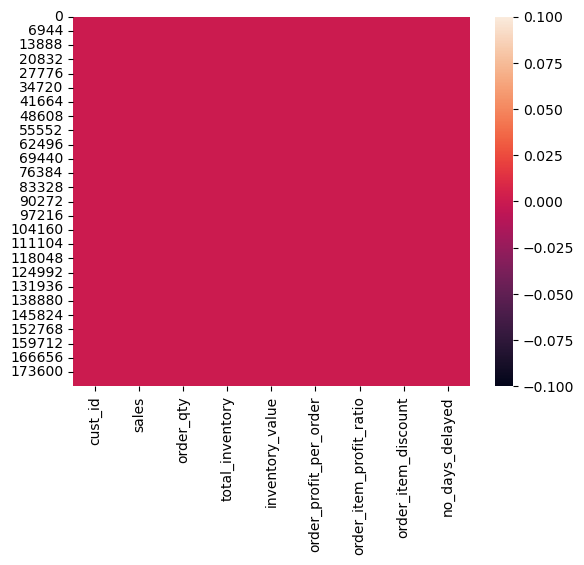

In [310]:
# Checking null values
sns.heatmap(df.isnull())

In [312]:
# Checking duplicates
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(df.shape)

Number of duplicate rows = 16
(180519, 9)


In [313]:
# Dropping duplicates
df.drop_duplicates(inplace=True) 
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(df.shape)

Number of duplicate rows = 0
(180503, 9)


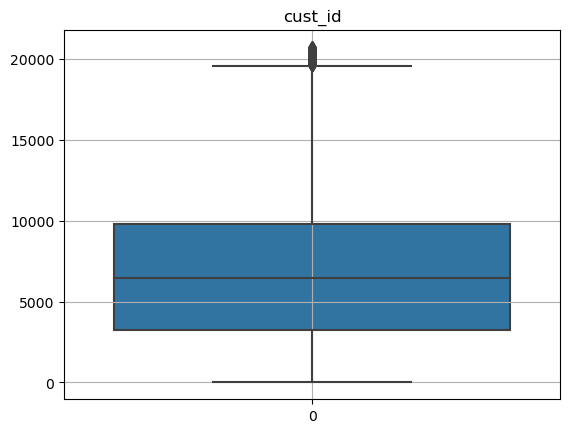

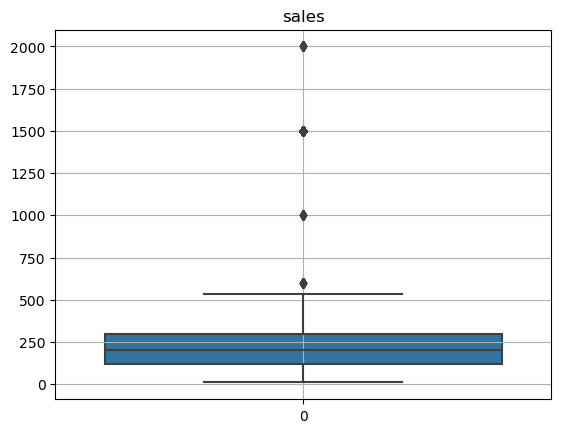

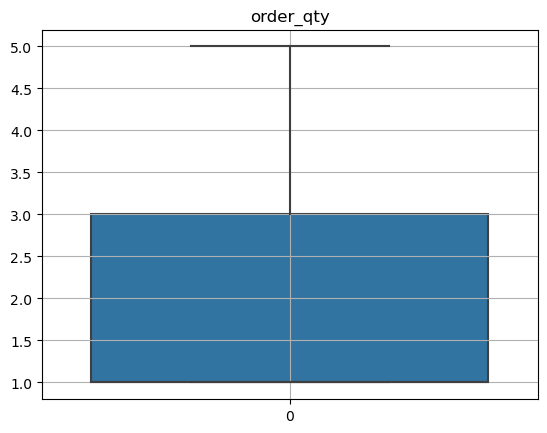

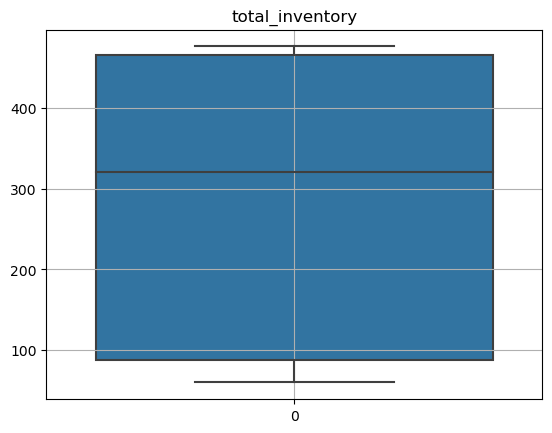

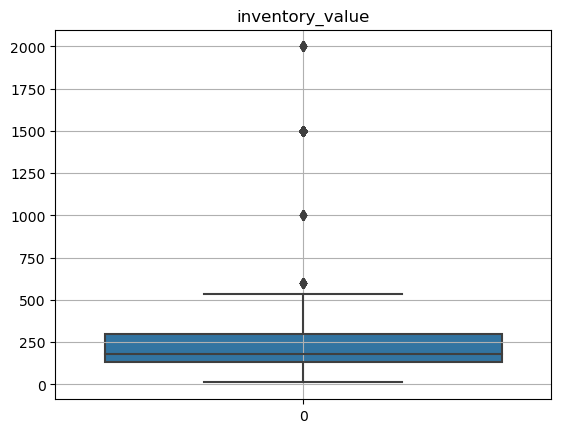

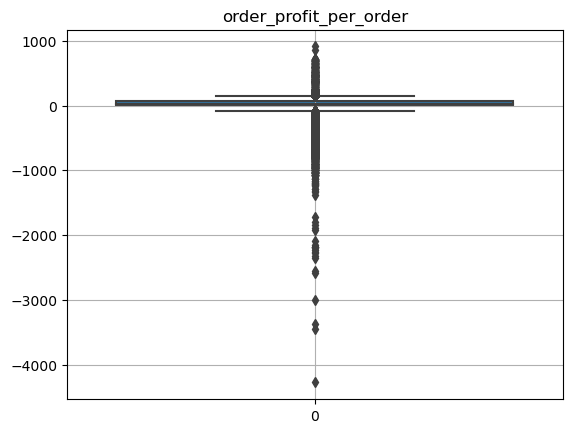

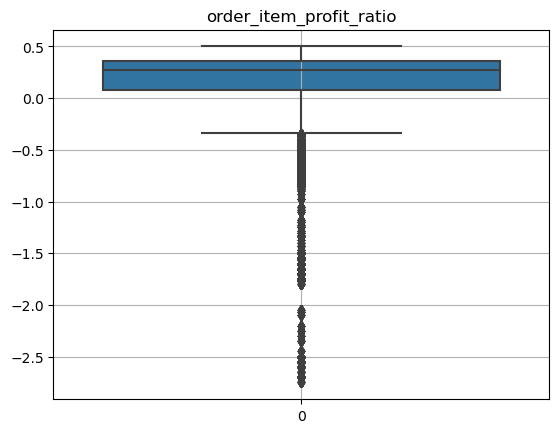

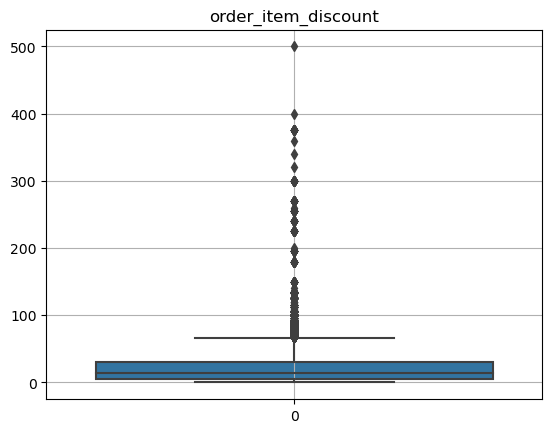

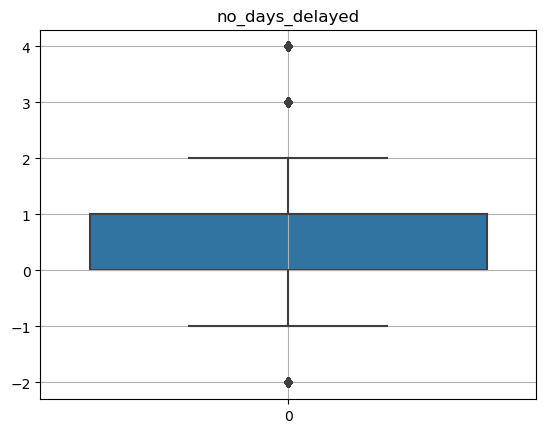

In [317]:
# Checking for Outliers using boxplot
for i in df.columns:
    sns.boxplot(df[i],whis=1.5)
    plt.grid()
    plt.title(f'{i}')
    plt.show();

In [318]:
# Checking for correlation
correlations = df.corr()
correlations

,cust_id,sales,order_qty,total_inventory,inventory_value,order_profit_per_order,order_item_profit_ratio,order_item_discount,no_days_delayed
cust_id,1.000000,0.060970,-0.091328,-0.128758,0.070627,0.009355,-0.000336,0.038507,0.002890
sales,0.060970,1.000000,0.106486,-0.282372,0.881690,0.131759,-0.001797,0.617470,-0.003701
order_qty,-0.091328,0.106486,1.000000,0.643337,-0.248586,0.015724,0.001141,0.065390,0.001806
total_inventory,-0.128758,-0.282372,0.643337,1.000000,-0.321842,-0.037287,0.002567,-0.173984,0.003552
inventory_value,0.070627,0.881690,-0.248586,-0.321842,1.000000,0.115603,-0.000836,0.544983,-0.004473
order_profit_per_order,0.009355,0.131759,0.015724,-0.037287,0.115603,1.000000,0.823690,0.064749,-0.005387
order_item_profit_ratio,-0.000336,-0.001797,0.001141,0.002567,-0.000836,0.823690,1.000000,-0.002794,-0.003373
order_item_discount,0.038507,0.617470,0.065390,-0.173984,0.544983,0.064749,-0.002794,1.000000,-0.000261
no_days_delayed,0.002890,-0.003701,0.001806,0.003552,-0.004473,-0.005387,-0.003373,-0.000261,1.000000


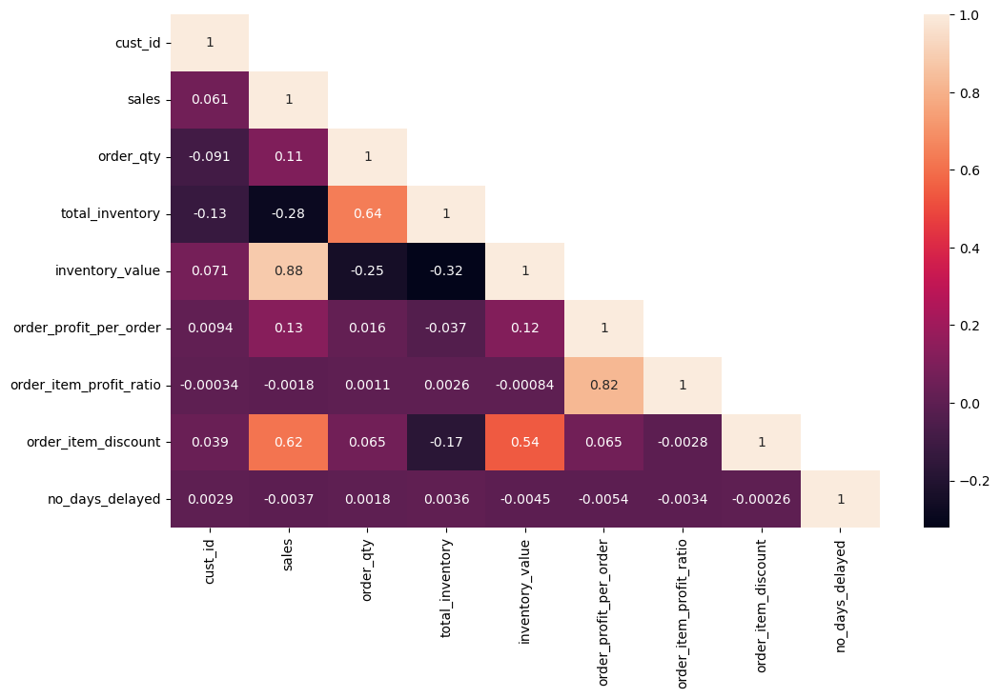

In [319]:
#Heatmap for coorelation
plt.figure(figsize=(12,7))
sns.heatmap(correlations, annot=True,mask=np.triu(correlations,+1));

In [325]:
## Train Test Split
X = df.drop('sales', axis=1)  # Features
y = df['sales']  # Target variable

In [328]:
# Split data into train and test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [329]:
model =LinearRegression()

In [330]:
model.fit(X_train,y_train)

LinearRegression()

In [331]:
y_predction = model.predict(X_test)

In [332]:
mser = mean_squared_error(y_test,y_predction)
r2 = r2_score(y_test,y_predction)
print(f"Mean Squared Error (MSE): {mser}")
print(f"R-squared (R2): {r2}")

Mean Squared Error (MSE): 709.4246287898327
R-squared (R2): 0.9591746648207871


In [ ]:
# Interpretation of Values

In [333]:
from joblib import dump

# Save the model to a file in the current working directory
dump(model, 'model.pkl')

['model.pkl']

In [334]:
from joblib import load

# Load the model from the file
loaded_model = load('model.pkl')

# Now, 'loaded_model' contains the loaded model